# Analisis de precios de crypto

https://www.cryptodatadownload.com/data/binance/


Combinar con data de ITB -> ver el acceso a analytics y otras cosas

In [2]:
import numpy as np
import pandas as pd

from sklearn.model_selection import cross_val_score
from sklearn import model_selection
from sklearn.metrics import roc_auc_score

from hyperopt import fmin, tpe, hp, SparkTrials, STATUS_OK, Trials

import mlflow

import lightgbm as lgb
from scipy.stats import ks_2samp

# Datos

## Leer datos

In [ ]:
#https://www.cryptodatadownload.com/cdd/Bitstamp_ETHUSD_d.csv
#https://www.cryptodatadownload.com/cdd/Bitstamp_ETHUSD_1h.csv

In [22]:
CRYPTO = 'BTC'
TIEMPO = 'minute' #'1h' 'minute'

In [6]:

# # The first thing we want to do is import the Pandas library and set the filepath to our data file
# import pandas as pd
# filepath = f"https://www.cryptodatadownload.com/cdd/Binance_{CRYPTO}USDT_{TIEMPO}.csv" # usar d para dias y 1h para horas
# # BTC / ETH al principio

# import ssl  # we need to import this library and tweak one setting due to fact we use HTTPS certificate(s)
# ssl._create_default_https_context = ssl._create_unverified_context



filepath = "/Users/lucaspecina/side_projects/crypto_price_prediction/crypto_data/Binance_BTCUSDT_minute.csv"


# Now we want to create a dataframe and use Pandas' to_csv function to read in our file
df = pd.read_csv(filepath, skiprows=1)  # we use skiprows parameter because first row contains our web address

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1509986 entries, 0 to 1509985
Data columns (total 10 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   unix         1509986 non-null  int64  
 1   date         1509986 non-null  object 
 2   symbol       1509986 non-null  object 
 3   open         1509986 non-null  float64
 4   high         1509986 non-null  float64
 5   low          1509986 non-null  float64
 6   close        1509986 non-null  float64
 7   Volume BTC   1509986 non-null  float64
 8   Volume USDT  1509986 non-null  float64
 9   tradecount   1509986 non-null  int64  
dtypes: float64(6), int64(2), object(2)
memory usage: 115.2+ MB


In [7]:
df = df.reset_index().sort_values('index',ascending=False).set_index('date').drop(columns=['index','unix','symbol','tradecount'])
df

,open,high,low,close,Volume BTC,Volume USDT
date,,,,,,
2019-09-08 17:57:00,10000.00,10000.00,10000.00,10000.00,0.00100,1.000000e+01
2019-09-08 17:58:00,10000.00,10000.00,10000.00,10000.00,0.00000,0.000000e+00
2019-09-08 17:59:00,10000.00,10000.00,10000.00,10000.00,0.00100,1.000000e+01
2019-09-08 18:00:00,10000.00,10000.00,10000.00,10000.00,0.00000,0.000000e+00
2019-09-08 18:01:00,10000.00,10000.00,10000.00,10000.00,0.00000,0.000000e+00
...,...,...,...,...,...,...
2022-07-27 08:39:00,21400.48,21404.94,21370.60,21374.88,124.52471,2.662596e+06
2022-07-27 08:40:00,21376.72,21383.59,21365.00,21368.06,79.80295,1.705508e+06
2022-07-27 08:41:00,21368.87,21383.24,21361.66,21366.17,93.96567,2.008269e+06


## Feature engineering

La idea es replicar las cosas que uno tiene en cuenta cuando hace analisis tecnico.

Puedo comenzar con resumenes basicos de cosas hacia el pasado. 
- estadisticas de las ultimas x hacia atras
- tendencias: cambios porcentuales con x hacia atras
- regresiones lineales (slopes) con x hacia atras

In [8]:
for win in [1,2,3,4,5,7,10,15,20,30,40,60,120,200,365]:
  
  # mean
  df[f'mean_{win}'] = df.close.rolling(window=win).mean()
  # median
  df[f'median_{win}'] = df.close.rolling(window=win).median()
  # max
  df[f'max_{win}'] = df.close.rolling(window=win).max()
  # min
  df[f'min_{win}'] = df.close.rolling(window=win).min()
  # std
  if win > 1:
    df[f'std_{win}'] = df.close.rolling(window=win).std()
  # slope
  df[f'slope_{win}'] = (df.close-df.close.shift(win))/(win)
  # pct_change
  df[f'pct_change_{win}'] = df.close.pct_change(periods=win)

/var/folders/x5/0d70vbjd0t714ttwv0hfghk80000gn/T/ipykernel_68442/3944606413.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'max_{win}'] = df.close.rolling(window=win).max()
/var/folders/x5/0d70vbjd0t714ttwv0hfghk80000gn/T/ipykernel_68442/3944606413.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'min_{win}'] = df.close.rolling(window=win).min()
/var/folders/x5/0d70vbjd0t714ttwv0hfghk80000gn/T/ipykernel_68442/3944606413.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of cal

In [9]:
df = df.dropna(axis=0)\
  #.tail(25000)
df.shape

(1509621, 110)

In [10]:
#import datetime as dt
#from scipy import stats
#
#df = pd.DataFrame(list, columns=['date', 'value'])
#df.date =pd.to_datetime(df.date)
#df['date_ordinal'] = pd.to_datetime(df['date']).map(dt.datetime.toordinal)
#slope, intercept, r_value, p_value, std_err = stats.linregress(df['date_ordinal'], df['value'])
#
#slope

In [11]:
df['close_next'] = df.close.shift(-1)
df['pct_change_next'] = (df.close_next - df.close) / df.close
df[['close','close_next','pct_change_next','pct_change_1','slope_1']].head(20)

/var/folders/x5/0d70vbjd0t714ttwv0hfghk80000gn/T/ipykernel_68442/3123165889.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['close_next'] = df.close.shift(-1)
/var/folders/x5/0d70vbjd0t714ttwv0hfghk80000gn/T/ipykernel_68442/3123165889.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['pct_change_next'] = (df.close_next - df.close) / df.close


,close,close_next,pct_change_next,pct_change_1,slope_1
date,,,,,
2019-09-09 00:03:00,10391.63,10391.63,0.0,0.0,0.0
2019-09-09 00:04:00,10391.63,10391.63,0.0,0.0,0.0
2019-09-09 00:05:00,10391.63,10391.63,0.0,0.0,0.0
2019-09-09 00:06:00,10391.63,10391.63,0.0,0.0,0.0
2019-09-09 00:07:00,10391.63,10391.63,0.0,0.0,0.0
2019-09-09 00:08:00,10391.63,10391.63,0.0,0.0,0.0
2019-09-09 00:09:00,10391.63,10391.63,0.0,0.0,0.0
2019-09-09 00:10:00,10391.63,10391.63,0.0,0.0,0.0
2019-09-09 00:11:00,10391.63,10391.63,0.0,0.0,0.0


/var/folders/x5/0d70vbjd0t714ttwv0hfghk80000gn/T/ipykernel_68442/2730780623.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.pct_change_next)


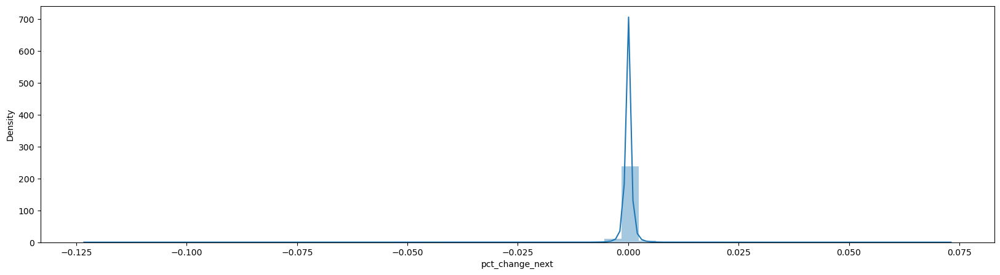

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize = (20,5))

sns.distplot(df.pct_change_next)
plt.show()

In [13]:
df.pct_change_next.describe()

count    1.509620e+06
mean     1.145794e-06
std      1.155360e-03
min     -1.230804e-01
25%     -4.235647e-04
50%     -2.048937e-07
75%      4.197131e-04
max      7.292082e-02
Name: pct_change_next, dtype: float64

## Train Test Split

In [14]:
# Separo en Train y Test

df_usar = df.copy().iloc[:-1,:]


train1, test = model_selection.train_test_split(df, test_size=0.2, random_state=10)
train, valid = model_selection.train_test_split(train1, test_size=0.25, random_state=10)

X_train = train.drop([ 'pct_change_next','close_next' ], axis=1) 
y_train_base = train['pct_change_next']

X_valid = valid.drop([ 'pct_change_next','close_next' ], axis=1) 
y_valid_base = valid['pct_change_next']

X_test = test.drop([ 'pct_change_next','close_next' ], axis=1) 
y_test_base = test['pct_change_next']

print(X_train.shape)
print(X_valid.shape)
print(X_test.shape)

#print(y_train.value_counts())
#print(y_valid.value_counts())
#print(y_test.value_counts())

(905772, 110)
(301924, 110)
(301925, 110)


# Clasif binaria SUBA

### Construir TARGET

El target debe construirse con el valor de CLOSE del SIGUIENTE DIA

In [17]:
# pruebo con 0.01 (van a quedar pocos positivos y negativos)
max_threshold = 0.0
TARGET = 'TARGET'

y_train = pd.DataFrame(y_train_base)
y_train[TARGET] = np.where(y_train.pct_change_next > max_threshold, 1, 0)
y_train = y_train[TARGET]

y_valid = pd.DataFrame(y_valid_base)
y_valid[TARGET] = np.where(y_valid.pct_change_next > max_threshold, 1, 0)
y_valid = y_valid[TARGET]

y_test = pd.DataFrame(y_test_base)
y_test[TARGET] = np.where(y_test.pct_change_next > max_threshold, 1, 0)
y_test = y_test[TARGET]


In [18]:
y_train.value_counts()

0    457072
1    448700
Name: TARGET, dtype: int64

In [25]:
X_train.to_csv("/Users/lucaspecina/side_projects/crypto_price_prediction/crypto_data/Binance_BTCUSDT_minute_suba_TRAIN_X.csv", index=False)
y_train.to_csv("/Users/lucaspecina/side_projects/crypto_price_prediction/crypto_data/Binance_BTCUSDT_minute_suba_TRAIN_y.csv", index=False)
X_test.to_csv("/Users/lucaspecina/side_projects/crypto_price_prediction/crypto_data/Binance_BTCUSDT_minute_suba_TEST_X.csv", index=False)
y_test.to_csv("/Users/lucaspecina/side_projects/crypto_price_prediction/crypto_data/Binance_BTCUSDT_minute_suba_TEST_y.csv", index=False)

## HPO

In [19]:

def gen_val_table_10_rangs(score_name, X_test, col_y_test, col_y_hat__, n_rangos):
  rangos= n_rangos
  df_temp = X_test.copy()
  df_temp['target'] = df_temp[col_y_test]
  df_temp['y_hat'] = df_temp[col_y_hat__]

  n_num = np.linspace(0, 1, rangos + 1)
  cutoff = np.unique(df_temp['y_hat'].quantile(n_num).values)
  #cutoff = np.round(cutoff, 7)
  cutoff = np.unique(cutoff)

  prob = pd.cut(df_temp['y_hat'], cutoff, include_lowest=True)
  bin = pd.cut(df_temp['y_hat'], cutoff, labels=range(1,len(cutoff)), include_lowest=True).tolist()
  pivot = pd.pivot_table(df_temp, index=[bin, prob], values=['target'], aggfunc=[np.sum, lambda x: x.count()])
  temp = pd.DataFrame(pivot.to_records())
  temp.columns = ['rango', 'score_tr', '#SUBAS', 'Total']

  temp['#no_subas'] = temp['Total'] - temp['#SUBAS']

  temp['%Total'] = (temp['Total'] / temp['Total'].sum()).round(3)

  temp['SUBAS Rate'] = (temp['#SUBAS'] / temp['Total']).round(2)
  temp['%SUBAS'] = (temp['#SUBAS'] / temp['#SUBAS'].sum()).round(3)
  temp['#SUBAS_Acum'] = temp['#SUBAS'].cumsum()

  temp['no_subas Rate'] = (temp['#no_subas'] / temp['Total']).round(2)
  temp['%no_subas'] = (temp['#no_subas'] / temp['#no_subas'].sum()).round(3)
  temp['#no_subas_Acum'] = temp['#no_subas'].cumsum()

  temp['CUM %SUBAS'] = (temp['%SUBAS'].cumsum()).round(3)
  temp['CUM %no_subas'] = (temp['%no_subas'].cumsum()).round(3)
  temp['CUM %Total'] = (temp['%Total'].cumsum()).round(3)

  temp['KS'] = (np.abs(temp['CUM %no_subas'] - temp['CUM %SUBAS'])).round(3)
  temp['Odds'] = (temp['#no_subas'] / temp['#SUBAS']).round(3)
  temp['Odds_Acum'] = (temp['#no_subas_Acum'] / temp['#SUBAS_Acum']).round(3)
  temp.sort_values("rango", ascending=False, inplace=True)
  temp_columns = ['rango', 'score_tr', 'Total', '%Total', 'CUM %Total', '#SUBAS', 'SUBAS Rate', '%SUBAS', 'CUM %SUBAS',
  '#SUBAS_Acum', '#no_subas', 'no_subas Rate', '%no_subas', 'CUM %no_subas', '#no_subas_Acum', 'KS', 'Odds', 'Odds_Acum']

  return temp[temp_columns]

In [20]:

def objective(PARAMETERS):

  # separar entre params y trainParams
  params = PARAMETERS['params']
  trainParams = PARAMETERS['trainParams']
  folds = PARAMETERS['folds']
  
  auc_cv = []
  ks_cv = []
  #probs_cv = pd.Series([])
  
  #mlflow.lightgbm.autolog()
  #mlflow.sklearn.autolog()
  
  with mlflow.start_run(run_name=runname, nested=True):
    
    mlflow.log_params(params)
    mlflow.log_params(trainParams)
    mlflow.set_tag('nro_variables',len(X_train.columns))
    print('PARAMS',params)
    print('TRAIN PARAMS',trainParams)

    # Bucle que itera entre Folds del CrossValidation
    for i, (train_idx, valid_idx) in enumerate(folds):
      Xt = X_train.iloc[train_idx]
      yt = y_train.loc[X_train.index].iloc[train_idx]

      Xv = X_train.iloc[valid_idx]
      yv = y_train.loc[X_train.index].iloc[valid_idx]
      
      
      # Cuando usamos LGBM con EarlyStop
      if trainParams['eval_set'] == True:
        trainParams["eval_set"] = [(Xt, yt), (Xv, yv)]
        # ARMADO DEL MODELO
        learner = lgb.LGBMClassifier(**params)
        learner.fit(Xt, yt, **trainParams)
      
      else:
        # ARMADO DEL MODELO
        learner = lgb.LGBMClassifier(**params)
        learner.fit(Xt, yt)

      # Armo Predicciones de probabilidad y Labels para base de Validacion y Test
      probs_ap = pd.Series(learner.predict_proba(Xv)[:, -1], index=Xv.index, name="prob_val")
      
      auc_fold = roc_auc_score(yv, probs_ap)
      ks_fold = ks_2samp(probs_ap[yv==1], probs_ap[yv==0]).statistic
      #mlflow.log_metric(f'ks_fold_{i}', ks_fold)
      # METRICAS del fold
      auc_cv.append(auc_fold)
      ks_cv.append(ks_fold)
      
      #print(f'\n-----------------------------------\nFIN ITERACION {i} \n------------------------------------')
    
    
    # METRICAS DE TODOS LOS FOLDS (aca deberia en vez de promediar, concat las probs y sacar las metricas con todos)
    print('TERMINARON TODAS LAS ITERACIONES')
    #mlflow.log_metric('auc_folds_NAs',auc_cv)
    mlflow.log_metric('ks_folds_NAs',pd.isna(pd.Series(ks_cv)).sum())
    auc  = np.array(auc_cv).mean()
    ks = np.array(ks_cv).mean()
    mlflow.log_metric('ks_cv_mean',ks)
    mlflow.log_metric('auc_cv_mean',auc)
    
    
    
    ###########################################################################################################
    # ------------------------------------------------------------------------------
    # NUEVO ENTRENAMIENTO DEL MODELO
    
    learner = lgb.LGBMClassifier(**params, importance_type='split')
    learner.fit(X_train, y_train) #**trainParams)
    #mlflow.lightgbm.log_model(learner.booster_, 'HYPEROPT')
    
    # FEATURE IMPORTANCES : CANTIDAD DE VARIABLES USADAS
    mlflow.log_metric('variables_usadas',(learner.feature_importances_ > 0).sum())

    
    # ------------------------
    # METRICAS DE EVALUACION CON TRAIN, VALID Y TEST
    
    # metricas de train
    train_probs = pd.Series(learner.predict_proba(X_train)[:,-1], index=X_train.index)
    auc_train = roc_auc_score(y_train, train_probs)
    ks_train = ks_2samp(train_probs[y_train==1], train_probs[y_train!=1]).statistic
    mlflow.log_metric('auc_train',auc_train)
    mlflow.log_metric('ks_train',ks_train)
        
    #metricas de valid
    valid_probs = pd.Series(learner.predict_proba(X_valid)[:,-1], index=X_valid.index)
    auc_valid = roc_auc_score(y_valid, valid_probs)
    ks_valid = ks_2samp(valid_probs[y_valid==1], valid_probs[y_valid!=1]).statistic
    mlflow.log_metric('auc_valid',auc_valid)
    mlflow.log_metric('ks_valid',ks_valid)
    mlflow.log_metric('diff_ks_valid_train', abs(ks_valid-ks_train))
    
    # metricas de test
    test_probs = pd.Series(learner.predict_proba(X_test)[:,-1],index=X_test.index)
    auc_test = roc_auc_score(y_test, test_probs)
    ks_test = ks_2samp(test_probs[y_test==1], test_probs[y_test!=1]).statistic
    mlflow.log_metric('auc_test',auc_test)
    mlflow.log_metric('ks_test',ks_test)   
    mlflow.log_metric('dif_ks_train_test', abs(ks_train - ks_test))

    

    mlflow.set_tag('objetivo_loss', '-ks')
    return {'loss': -ks, 'status': STATUS_OK}


In [21]:
from sklearn import model_selection

folds = list(model_selection.StratifiedKFold(n_splits=3, shuffle=True, random_state=1).split(X_train, y_train))

space = {
  'params':
  {
  'learning_rate': hp.uniform('learning_rate', 0.2, 0.35),
  'num_leaves': hp.choice('num_leaves',range(2000,4000,1)),
  'n_estimators': hp.choice('n_estimators',range(200,800,1)),
  'max_depth': hp.choice('max_depth', range(1,30,1)),
  'bagging_fraction': hp.uniform('bagging_fraction', 0, 1),
  'feature_fraction':  hp.uniform('feature_fraction', 0, 1),
  
  'min_child_samples': hp.choice('min_child_samples', range(120,160,1)),
  'min_data_in_leaf': hp.choice('min_data_in_leaf', range(int(0.01*train.shape[0]), int(0.5*train.shape[0]),1)),
  
  'colsample_bytree':  hp.uniform('colsample_bytree', 0.2, 1.0),
  'min_child_weight':  hp.uniform('min_child_weight', 0.7, 1.0),
  
  'reg_alpha': hp.choice('reg_alpha', range(10,30,1)),
  'reg_lambda': hp.uniform('reg_lambda', 0,5),
  },
  
  'trainParams':
  {
  "early_stopping_rounds":hp.choice('early_stopping_rounds', range(5,30,1)),
  "eval_metric": "auc", 
  "eval_set": False,
    'verbose':1
  },
  
  'folds': folds
}


In [23]:
output_tipo = 'BINARY_SUBE'
algoritmo = 'LGBM'

HPO = tpe.suggest # rand.suggest
HPO_name = 'Bayesian' if HPO == tpe.suggest else 'Random'  # ['Bayesian','Random']

EVALUACIONES = 10
n_trials = 3
intento = np.random.randint(1,30000,1)[0]


#spark_trials = SparkTrials(n_trials)
runname = f'{CRYPTO}-{TIEMPO}-{algoritmo}-{HPO_name}-{output_tipo}-{max_threshold}-{str(intento)}'
#mlflow.sklearn.autolog()

# Optimazation part
with mlflow.start_run(run_name=runname):
  spark_trials_run_id = mlflow.active_run().info.run_id
  argmin = fmin(
      fn=objective, 
      space=space,
      algo=HPO,
      max_evals=EVALUACIONES,
     # trials=spark_trials,
      verbose=1
  )


PARAMS                                                
{'bagging_fraction': 0.8885238487027218, 'colsample_bytree': 0.6181083735100654, 'feature_fraction': 0.8573865167816831, 'learning_rate': 0.33695416438033254, 'max_depth': 14, 'min_child_samples': 154, 'min_child_weight': 0.9110659016179616, 'min_data_in_leaf': 434720, 'n_estimators': 206, 'num_leaves': 2555, 'reg_alpha': 19, 'reg_lambda': 3.251298962366195}
TRAIN PARAMS                                          
{'early_stopping_rounds': 23, 'eval_metric': 'auc', 'eval_set': False, 'verbose': 1}
[LightGBM] [Warning] min_data_in_leaf is set=434720, min_child_samples=154 will be ignored. Current value: min_data_in_leaf=434720
[LightGBM] [Warning] bagging_fraction is set=0.8885238487027218, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8885238487027218
[LightGBM] [Warning] feature_fraction is set=0.8573865167816831, colsample_bytree=0.6181083735100654 will be ignored. Current value: feature_fraction=0.85738651678168

In [24]:

runs = mlflow.search_runs()
runs = runs[(runs['tags.mlflow.runName']==runname) 
            & (runs['metrics.diff_ks_valid_train'] <= 0.05)
            & (runs['metrics.ks_cv_mean'] > 0)
           ].sort_values(['metrics.ks_cv_mean'], ascending=False)

runs[['metrics.diff_ks_valid_train','metrics.ks_cv_mean','metrics.ks_train','metrics.ks_valid','metrics.ks_test','metrics.variables_usadas','run_id']]

,metrics.diff_ks_valid_train,metrics.ks_cv_mean,metrics.ks_train,metrics.ks_valid,metrics.ks_test,metrics.variables_usadas,run_id
2,0.019089,0.052532,0.073995,0.054906,0.056322,110.0,521ecb42ea584fb58417a4ccad0ba427
4,0.011888,0.051287,0.068865,0.056977,0.057253,75.0,58dc8d62f7464962b8e13cf68f420d6e
5,0.009459,0.047613,0.059045,0.049586,0.051888,79.0,008caacf0f1542a0a7d0b830aa03c791
7,0.005071,0.038678,0.055452,0.050382,0.050126,66.0,bd28b72218054069935080f5f4cfe55d
8,0.005214,0.033384,0.054600,0.049386,0.049751,65.0,e79732caca7148b4ba699469bc932b68
1,0.003951,0.031602,0.052612,0.048661,0.047573,60.0,6fc49e4d93824407b238691adb303705
0,0.001604,0.031264,0.044968,0.043364,0.040833,36.0,89320782c6e54f97bf5afddc29673f6d


## Carga parametros modelo (nuevo entrenamiento)

In [26]:
#run_id = '615e7c7949114a1483415607e4bbb54f'
#run_id = '3d355d795734400cb8bfb33f24c2df15'
# run_id = 'd2b14c34f76440f19502e20be43dd263'
run_id = '58dc8d62f7464962b8e13cf68f420d6e'


run = mlflow.get_run(run_id)

run_dic = run.to_dictionary()
parameters = run_dic['data']['params']


params = space['params'].keys()
#trainParams = space['trainParams'].keys()

params = {k:parameters[k] for k in params}
#trainParams = {k:parameters[k] for k in trainParams}

params = {k:eval(params[k]) for k in params}
#trainParams = {k:eval(trainParams[k]) for k in trainParams}
#trainParams['eval_metric'] = 'auc'

  
modelo_suba = lgb.LGBMClassifier(**params, importance_type='gain')
modelo_suba.fit(X_train, y_train)

print('Variables usadas: ',(modelo_suba.feature_importances_ > 0).sum())
modelo_suba

[LightGBM] [Warning] min_data_in_leaf is set=161001, min_child_samples=132 will be ignored. Current value: min_data_in_leaf=161001
[LightGBM] [Warning] bagging_fraction is set=0.8033928484735692, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033928484735692
[LightGBM] [Warning] feature_fraction is set=0.8838346393305632, colsample_bytree=0.5256055953611678 will be ignored. Current value: feature_fraction=0.8838346393305632
Variables usadas:  75


LGBMClassifier(bagging_fraction=0.8033928484735692,
               colsample_bytree=0.5256055953611678,
               feature_fraction=0.8838346393305632, importance_type='gain',
               learning_rate=0.20752088887398537, max_depth=4,
               min_child_samples=132, min_child_weight=0.9263224971129655,
               min_data_in_leaf=161001, n_estimators=555, num_leaves=2037,
               reg_alpha=11, reg_lambda=2.401363013850734)

In [27]:
# METRICAS DE EVALUACION CON TRAIN, VALID Y TEST

# metricas de train
train_probs = pd.Series(modelo_suba.predict_proba(X_train)[:,-1], index=X_train.index)
auc_train = roc_auc_score(y_train, train_probs)
ks_train = ks_2samp(train_probs[y_train==1], train_probs[y_train!=1]).statistic

#metricas de valid
valid_probs = pd.Series(modelo_suba.predict_proba(X_valid)[:,-1], index=X_valid.index)
auc_valid = roc_auc_score(y_valid, valid_probs)
ks_valid = ks_2samp(valid_probs[y_valid==1], valid_probs[y_valid!=1]).statistic

# metricas de test
test_probs = pd.Series(modelo_suba.predict_proba(X_test)[:,-1],index=X_test.index)
auc_test = roc_auc_score(y_test, test_probs)
ks_test = ks_2samp(test_probs[y_test==1], test_probs[y_test!=1]).statistic

probs_SUBA = pd.concat([test_probs,valid_probs])
#probs_SUBA = pd.concat([probs_SUBA,train_probs])

print('KS_TRAIN',ks_train)
print('KS_VALID',ks_valid)
print('KS_TEST',ks_test)

print('\nAUC_TRAIN',auc_train)
print('AUC_VALID',auc_valid)
print('AUC_TEST',auc_valid)

KS_TRAIN 0.06886491766598235
KS_VALID 0.05697737482920695
KS_TEST 0.057252610463012554

AUC_TRAIN 0.5489788288382047
AUC_VALID 0.5397269559331416
AUC_TEST 0.5397269559331416


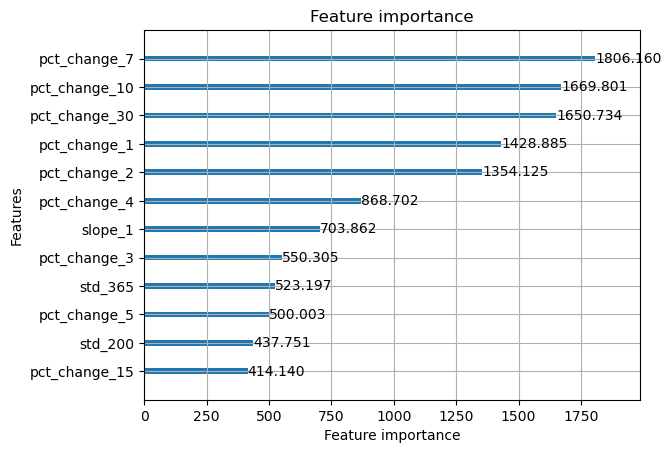

In [28]:
pd_importances = pd.DataFrame({'feature': X_train.columns,'importance': modelo_suba.feature_importances_}).sort_values('importance', ascending = False)
lgb.plot_importance(modelo_suba, importance_type = 'gain', max_num_features  = 12 )
display()

In [29]:
# TABLA DE VALIDACION (con valid)

oot_probs = pd.Series(modelo_suba.predict_proba(X_valid)[:,1],index=X_valid.index)
# Armo df sólo con probabilidad y target
oot_df_perform = pd.concat( [ y_valid, oot_probs ], axis=1)
oot_df_perform.columns = [ 'target', 'Probs']
# Genero tabla de Performance (cambiar el parámetro de rango, según la tabla que se quiera)
Tabla_Performance_OOT = gen_val_table_10_rangs('Performance', oot_df_perform, 'target', 'Probs', 10)
Tabla_Performance_OOT

,rango,score_tr,Total,%Total,CUM %Total,#SUBAS,SUBAS Rate,%SUBAS,CUM %SUBAS,#SUBAS_Acum,#no_subas,no_subas Rate,%no_subas,CUM %no_subas,#no_subas_Acum,KS,Odds,Odds_Acum
99,10,"(0.541, 0.655]",30193.0,0.1,1.0,16990,0.56,0.114,1.000,149459,13203.0,0.44,0.087,1.000,152465.0,0.000,0.777,1.020
98,10,"(0.525, 0.541]",NaN,NaN,NaN,0,NaN,0.000,0.886,132469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97,10,"(0.513, 0.525]",NaN,NaN,NaN,0,NaN,0.000,0.886,132469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96,10,"(0.503, 0.513]",NaN,NaN,NaN,0,NaN,0.000,0.886,132469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95,10,"(0.494, 0.503]",NaN,NaN,NaN,0,NaN,0.000,0.886,132469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6,1,"(0.503, 0.513]",NaN,NaN,NaN,0,NaN,0.000,0.088,13154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1,"(0.513, 0.525]",NaN,NaN,NaN,0,NaN,0.000,0.088,13154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1,"(0.525, 0.541]",NaN,NaN,NaN,0,NaN,0.000,0.088,13154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1,"(0.541, 0.655]",NaN,NaN,NaN,0,NaN,0.000,0.088,13154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
# TABLA DE VALIDACION (con test)

oot_probs = pd.Series(modelo_suba.predict_proba(X_test)[:,1],index=X_test.index)
# Armo df sólo con probabilidad y target
oot_df_perform = pd.concat( [ y_test, oot_probs ], axis=1)
oot_df_perform.columns = [ 'target', 'Probs']
# Genero tabla de Performance (cambiar el parámetro de rango, según la tabla que se quiera)
Tabla_Performance_OOT = gen_val_table_10_rangs('Performance', oot_df_perform, 'target', 'Probs', 10)
Tabla_Performance_OOT

,rango,score_tr,Total,%Total,CUM %Total,#SUBAS,SUBAS Rate,%SUBAS,CUM %SUBAS,#SUBAS_Acum,#no_subas,no_subas Rate,%no_subas,CUM %no_subas,#no_subas_Acum,KS,Odds,Odds_Acum
99,10,"(0.541, 0.649]",30193.0,0.1,1.0,17061,0.57,0.114,1.000,149554,13132.0,0.43,0.086,0.999,152371.0,0.001,0.770,1.019
98,10,"(0.525, 0.541]",NaN,NaN,NaN,0,NaN,0.000,0.886,132493,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97,10,"(0.513, 0.525]",NaN,NaN,NaN,0,NaN,0.000,0.886,132493,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96,10,"(0.503, 0.513]",NaN,NaN,NaN,0,NaN,0.000,0.886,132493,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95,10,"(0.494, 0.503]",NaN,NaN,NaN,0,NaN,0.000,0.886,132493,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6,1,"(0.503, 0.513]",NaN,NaN,NaN,0,NaN,0.000,0.088,13147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1,"(0.513, 0.525]",NaN,NaN,NaN,0,NaN,0.000,0.088,13147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1,"(0.525, 0.541]",NaN,NaN,NaN,0,NaN,0.000,0.088,13147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1,"(0.541, 0.649]",NaN,NaN,NaN,0,NaN,0.000,0.088,13147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
import plotly.express as px

df_probs = pd.concat([valid_probs,y_valid],axis=1)
df_probs.columns = ['prob','target']

px.violin(df_probs, y="prob", 
          #x="target",
          violinmode='overlay',color='target',
          hover_data=df_probs.columns)


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'box': {'visible': False},
              'customdata': array([[0],
                                   [0],
                                   [0],
                                   ...,
                                   [0],
                                   [0],
                                   [0]]),
              'hovertemplate': 'target=%{customdata[0]}<br>prob=%{y}<extra></extra>',
              'legendgroup': '0',
              'marker': {'color': '#636efa'},
              'name': '0',
              'offsetgroup': '0',
              'orientation': 'v',
              'scalegroup': 'True',
              'showlegend': True,
              'type': 'violin',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([0.61229933, 0.44628871, 0.5224525 , ..., 0.52525175, 0.55618352,
                          0.49258095]),
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'box': {'visible': False},
              'customdata': array([[1],
                                   [1],
                                   [1],
                                   ...,
                                   [1],
                                   [1],
                                   [1]]),
              'hovertemplate': 'target=%{customdata[0]}<br>prob=%{y}<extra></extra>',
              'legendgroup': '1',
              'marker': {'color': '#EF553B'},
              'name': '1',
              'offsetgroup': '1',
              'orientation': 'v',
              'scalegroup': 'True',
              'showlegend': True,
              'type': 'violin',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([0.52352081, 0.50626183, 0.45834325, ..., 0.45421888, 0.44821945,
                          0.48615996]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'legend': {'title': {'text': 'target'}, 'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'violinmode': 'overlay',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'prob'}}}
})

In [ ]:
df_probs.sort_values('prob',ascending=False).head(30)

Out[112]:

,prob,target
date,,
2017-11-29 05-PM,0.674941,0
2020-03-20 05-PM,0.671986,0
2017-12-08 05-AM,0.660789,1
2018-01-22 11-AM,0.657515,1
2018-02-17 02-PM,0.645211,1
2019-06-27 04-PM,0.641329,0
2019-06-27 08-AM,0.640390,0
2018-02-03 10-PM,0.639117,1
2018-07-04 01-AM,0.637118,0


In [32]:
df_probs[df_probs.prob>=0.6].target.value_counts()

1    1031
0     535
Name: target, dtype: int64

In [34]:
# menores_probs = df_probs.sort_values('prob',ascending=True).head(30).merge(df_iguales[['close','close_next']],
#         how='left', left_index=True, right_index=True)

# menores_probs['es_igual'] = np.where(menores_probs.close == menores_probs.close_next, 1, 0)
# menores_probs

# Clasif binaria BAJA

### Construir TARGET

El target debe construirse con el valor de CLOSE del SIGUIENTE DIA

In [ ]:
# pruebo con 0.01 (van a quedar pocos positivos y negativos)
min_threshold = -0.00
TARGET = 'TARGET'

y_train = pd.DataFrame(y_train_base)
y_train[TARGET] = np.where(y_train.pct_change_next < min_threshold, 1, 0)
y_train = y_train[TARGET]

y_valid = pd.DataFrame(y_valid_base)
y_valid[TARGET] = np.where(y_valid.pct_change_next < min_threshold, 1, 0)
y_valid = y_valid[TARGET]

y_test = pd.DataFrame(y_test_base)
y_test[TARGET] = np.where(y_test.pct_change_next < min_threshold, 1, 0)
y_test = y_test[TARGET]


In [ ]:
y_train.value_counts()

Out[173]: 0 11672
1 9385
Name: TARGET, dtype: int64

## HPO

In [ ]:

def gen_val_table_10_rangs(score_name, X_test, col_y_test, col_y_hat__, n_rangos):
  rangos= n_rangos
  df_temp = X_test.copy()
  df_temp['target'] = df_temp[col_y_test]
  df_temp['y_hat'] = df_temp[col_y_hat__]

  n_num = np.linspace(0, 1, rangos + 1)
  cutoff = np.unique(df_temp['y_hat'].quantile(n_num).values)
  #cutoff = np.round(cutoff, 7)
  cutoff = np.unique(cutoff)

  prob = pd.cut(df_temp['y_hat'], cutoff, include_lowest=True)
  bin = pd.cut(df_temp['y_hat'], cutoff, labels=range(1,len(cutoff)), include_lowest=True).tolist()
  pivot = pd.pivot_table(df_temp, index=[bin, prob], values=['target'], aggfunc=[np.sum, lambda x: x.count()])
  temp = pd.DataFrame(pivot.to_records())
  temp.columns = ['rango', 'score_tr', '#BAJAS', 'Total']

  temp['#no_bajas'] = temp['Total'] - temp['#BAJAS']

  temp['%Total'] = (temp['Total'] / temp['Total'].sum()).round(3)

  temp['BAJAS Rate'] = (temp['#BAJAS'] / temp['Total']).round(2)
  temp['%BAJAS'] = (temp['#BAJAS'] / temp['#BAJAS'].sum()).round(3)
  temp['#BAJAS_Acum'] = temp['#BAJAS'].cumsum()

  temp['no_bajas Rate'] = (temp['#no_bajas'] / temp['Total']).round(2)
  temp['%no_bajas'] = (temp['#no_bajas'] / temp['#no_bajas'].sum()).round(3)
  temp['#no_bajas_Acum'] = temp['#no_bajas'].cumsum()

  temp['CUM %BAJAS'] = (temp['%BAJAS'].cumsum()).round(3)
  temp['CUM %no_bajas'] = (temp['%no_bajas'].cumsum()).round(3)
  temp['CUM %Total'] = (temp['%Total'].cumsum()).round(3)

  temp['KS'] = (np.abs(temp['CUM %no_bajas'] - temp['CUM %BAJAS'])).round(3)
  temp['Odds'] = (temp['#no_bajas'] / temp['#BAJAS']).round(3)
  temp['Odds_Acum'] = (temp['#no_bajas_Acum'] / temp['#BAJAS_Acum']).round(3)
  temp.sort_values("rango", ascending=False, inplace=True)
  temp_columns = ['rango', 'score_tr', 'Total', '%Total', 'CUM %Total', '#BAJAS', 'BAJAS Rate', '%BAJAS', 'CUM %BAJAS',
  '#BAJAS_Acum', '#no_bajas', 'no_bajas Rate', '%no_bajas', 'CUM %no_bajas', '#no_bajas_Acum', 'KS', 'Odds', 'Odds_Acum']

  return temp[temp_columns]

In [ ]:

def objective(PARAMETERS):

  # separar entre params y trainParams
  params = PARAMETERS['params']
  trainParams = PARAMETERS['trainParams']
  folds = PARAMETERS['folds']
  
  auc_cv = []
  ks_cv = []
  #probs_cv = pd.Series([])
  
  #mlflow.lightgbm.autolog()
  #mlflow.sklearn.autolog()
  
  with mlflow.start_run(run_name=runname, nested=True):
    
    mlflow.log_params(params)
    mlflow.log_params(trainParams)
    mlflow.set_tag('nro_variables',len(X_train.columns))
    print('PARAMS',params)
    print('TRAIN PARAMS',trainParams)

    # Bucle que itera entre Folds del CrossValidation
    for i, (train_idx, valid_idx) in enumerate(folds):
      Xt = X_train.iloc[train_idx]
      yt = y_train.loc[X_train.index].iloc[train_idx]

      Xv = X_train.iloc[valid_idx]
      yv = y_train.loc[X_train.index].iloc[valid_idx]
      
      
      # Cuando usamos LGBM con EarlyStop
      if trainParams['eval_set'] == True:
        trainParams["eval_set"] = [(Xt, yt), (Xv, yv)]
        # ARMADO DEL MODELO
        learner = lgb.LGBMClassifier(**params)
        learner.fit(Xt, yt, **trainParams)
      
      else:
        # ARMADO DEL MODELO
        learner = lgb.LGBMClassifier(**params)
        learner.fit(Xt, yt)

      # Armo Predicciones de probabilidad y Labels para base de Validacion y Test
      probs_ap = pd.Series(learner.predict_proba(Xv)[:, -1], index=Xv.index, name="prob_val")
      
      auc_fold = roc_auc_score(yv, probs_ap)
      ks_fold = ks_2samp(probs_ap[yv==1], probs_ap[yv==0]).statistic
      #mlflow.log_metric(f'ks_fold_{i}', ks_fold)
      # METRICAS del fold
      auc_cv.append(auc_fold)
      ks_cv.append(ks_fold)
      
      #print(f'\n-----------------------------------\nFIN ITERACION {i} \n------------------------------------')
    
    
    # METRICAS DE TODOS LOS FOLDS (aca deberia en vez de promediar, concat las probs y sacar las metricas con todos)
    print('TERMINARON TODAS LAS ITERACIONES')
    #mlflow.log_metric('auc_folds_NAs',auc_cv)
    mlflow.log_metric('ks_folds_NAs',pd.isna(pd.Series(ks_cv)).sum())
    auc  = np.array(auc_cv).mean()
    ks = np.array(ks_cv).mean()
    mlflow.log_metric('ks_cv_mean',ks)
    mlflow.log_metric('auc_cv_mean',auc)
    
    
    
    ###########################################################################################################
    # ------------------------------------------------------------------------------
    # NUEVO ENTRENAMIENTO DEL MODELO
    
    learner = lgb.LGBMClassifier(**params, importance_type='split')
    learner.fit(X_train, y_train) #**trainParams)
    #mlflow.lightgbm.log_model(learner.booster_, 'HYPEROPT')
    
    # FEATURE IMPORTANCES : CANTIDAD DE VARIABLES USADAS
    mlflow.log_metric('variables_usadas',(learner.feature_importances_ > 0).sum())

    
    # ------------------------
    # METRICAS DE EVALUACION CON TRAIN, VALID Y TEST
    
    # metricas de train
    train_probs = pd.Series(learner.predict_proba(X_train)[:,-1], index=X_train.index)
    auc_train = roc_auc_score(y_train, train_probs)
    ks_train = ks_2samp(train_probs[y_train==1], train_probs[y_train!=1]).statistic
    mlflow.log_metric('auc_train',auc_train)
    mlflow.log_metric('ks_train',ks_train)
        
    #metricas de valid
    valid_probs = pd.Series(learner.predict_proba(X_valid)[:,-1], index=X_valid.index)
    auc_valid = roc_auc_score(y_valid, valid_probs)
    ks_valid = ks_2samp(valid_probs[y_valid==1], valid_probs[y_valid!=1]).statistic
    mlflow.log_metric('auc_valid',auc_valid)
    mlflow.log_metric('ks_valid',ks_valid)
    mlflow.log_metric('diff_ks_valid_train', abs(ks_valid-ks_train))
    
    # metricas de test
    test_probs = pd.Series(learner.predict_proba(X_test)[:,-1],index=X_test.index)
    auc_test = roc_auc_score(y_test, test_probs)
    ks_test = ks_2samp(test_probs[y_test==1], test_probs[y_test!=1]).statistic
    mlflow.log_metric('auc_test',auc_test)
    mlflow.log_metric('ks_test',ks_test)   
    mlflow.log_metric('dif_ks_train_test', abs(ks_train - ks_test))

    

    mlflow.set_tag('objetivo_loss', '-ks')
    return {'loss': -ks, 'status': STATUS_OK}


In [ ]:
from sklearn import model_selection

folds = list(model_selection.StratifiedKFold(n_splits=3, shuffle=True, random_state=1).split(X_train, y_train))

space = {
  'params':
  {
  'learning_rate': hp.uniform('learning_rate', 0.2, 0.35),
  'num_leaves': hp.choice('num_leaves',range(2000,4000,1)),
  'n_estimators': hp.choice('n_estimators',range(200,800,1)),
  'max_depth': hp.choice('max_depth', range(1,30,1)),
  'bagging_fraction': hp.uniform('bagging_fraction', 0, 1),
  'feature_fraction':  hp.uniform('feature_fraction', 0, 1),
  
  'min_child_samples': hp.choice('min_child_samples', range(120,160,1)),
  'min_data_in_leaf': hp.choice('min_data_in_leaf', range(int(0.01*train.shape[0]), int(0.5*train.shape[0]),1)),
  
  'colsample_bytree':  hp.uniform('colsample_bytree', 0.2, 1.0),
  'min_child_weight':  hp.uniform('min_child_weight', 0.7, 1.0),
  
  'reg_alpha': hp.choice('reg_alpha', range(10,30,1)),
  'reg_lambda': hp.uniform('reg_lambda', 0,5),
  },
  
  'trainParams':
  {
  "early_stopping_rounds":hp.choice('early_stopping_rounds', range(5,30,1)),
  "eval_metric": "auc", 
  "eval_set": False,
    'verbose':1
  },
  
  'folds': folds
}


In [ ]:
output_tipo = 'BINARY_BAJA'
algoritmo = 'LGBM'

HPO = tpe.suggest # rand.suggest
HPO_name = 'Bayesian' if HPO == tpe.suggest else 'Random'  # ['Bayesian','Random']

EVALUACIONES = 10
n_trials = 3
intento = np.random.randint(1,30000,1)[0]


#spark_trials = SparkTrials(n_trials)
runname = f'{CRYPTO}-{TIEMPO}-{algoritmo}-{HPO_name}-{output_tipo}-{min_threshold}-{str(intento)}'
#mlflow.sklearn.autolog()

# Optimazation part
with mlflow.start_run(run_name=runname):
  spark_trials_run_id = mlflow.active_run().info.run_id
  argmin = fmin(
      fn=objective, 
      space=space,
      algo=HPO,
      max_evals=EVALUACIONES,
     # trials=spark_trials,
      verbose=1
  )


0%| | 0/10 [00:00<?, ?trial/s, best loss=?] PARAMS
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] {'bagging_fraction': 0.38608023229397403, 'colsample_bytree': 0.5228665301894055, 'feature_fraction': 0.996364961074821, 'learning_rate': 0.341883157045639, 'max_depth': 3, 'min_child_samples': 138, 'min_child_weight': 0.7480611203320817, 'min_data_in_leaf': 7594, 'n_estimators': 450, 'num_leaves': 2727, 'reg_alpha': 17, 'reg_lambda': 1.6470174340350803}
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] TRAIN PARAMS
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] {'early_stopping_rounds': 5, 'eval_metric': 'auc', 'eval_set': False, 'verbose': 1}
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] [LightGBM] [Warning] bagging_fraction is set=0.38608023229397403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38608023229397403
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] [LightGBM] [Warning] feature_fraction is set=0.996364961074821, colsample_bytree=0.5228665301894055 will be ignored. Current value: feature_fraction=0.996364961074821
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] [LightGBM] [Warning] min_data_in_leaf is set=7594, min_child_samples=138 will be ignored. Current value: min_data_in_leaf=7594
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] [LightGBM] [Warning] bagging_fraction is set=0.38608023229397403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38608023229397403
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] [LightGBM] [Warning] feature_fraction is set=0.996364961074821, colsample_bytree=0.5228665301894055 will be ignored. Current value: feature_fraction=0.996364961074821
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] [LightGBM] [Warning] min_data_in_leaf is set=7594, min_child_samples=138 will be ignored. Current value: min_data_in_leaf=7594
 0%| | 0/10 [00:02<?, ?trial/s, best loss=?] [LightGBM] [Warning] bagging_fraction is set=0.38608023229397403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38608023229397403
 0%| | 0/10 [00:03<?, ?trial/s, best loss=?] [LightGBM] [Warning] feature_fraction is set=0.996364961074821, colsample_bytree=0.5228665301894055 will be ignored. Current value: feature_fraction=0.996364961074821
 0%| | 0/10 [00:03<?, ?trial/s, best loss=?] [LightGBM] [Warning] min_data_in_leaf is set=7594, min_child_samples=138 will be ignored. Current value: min_data_in_leaf=7594
 0%| | 0/10 [00:03<?, ?trial/s, best loss=?] TERMINARON TODAS LAS ITERACIONES
 0%| | 0/10 [00:03<?, ?trial/s, best loss=?] [LightGBM] [Warning] bagging_fraction is set=0.38608023229397403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38608023229397403
 0%| | 0/10 [00:03<?, ?trial/s, best loss=?] [LightGBM] [Warning] feature_fraction is set=0.996364961074821, colsample_bytree=0.5228665301894055 will be ignored. Current value: feature_fraction=0.996364961074821
 0%| | 0/10 [00:03<?, ?trial/s, best loss=?] [LightGBM] [Warning] min_data_in_leaf is set=7594, min_child_samples=138 will be ignored. Current value: min_data_in_leaf=7594
 0%| | 0/10 [00:03<?, ?trial/s, best loss=?] 10%|█ | 1/10 [00:09<01:23, 9.23s/trial, best loss: -0.0] PARAMS
 10%|█ | 1/10 [00:11<01:23, 9.23s/trial, best loss: -0.0] {'bagging_fraction': 0.45103723754575953, 'colsample_bytree': 0.24321408542224915, 'feature_fraction': 0.5790190905798313, 'learning_rate': 0.3169573312326486, 'max_depth': 9, 'min_child_samples': 158, 'min_child_weight': 0.8090797551788323, 'min_data_in_leaf': 5264, 'n_estimators': 368, 'num_leaves': 3681, 'reg_alpha': 16, 'reg_lambda': 2.671968258575896}
 10%|█ | 1/10 [00:11<01:23, 9.23s/trial, best loss: -0.0] TRAIN PARAMS
 10%|█ | 1/10 [00:11<01:23, 9.23s/trial, best loss: -0.0] {'early_stopping_rounds': 12, 'eval_metric': 'auc', 'eval_set': False, 'verbose': 1}
 10%|█ | 1/10 [00:11<01:23, 9.23s/trial, best loss: -0.0] [LightGBM] [Warning] bagging_fraction is set=0.45103723754575953, subsample=1.0 will be ignored. Current v

In [ ]:

runs = mlflow.search_runs()
runs = runs[(runs['tags.mlflow.runName']==runname) 
            & (runs['metrics.diff_ks_valid_train'] <= 0.1)
            & (runs['metrics.ks_cv_mean'] > 0)
           ].sort_values(['metrics.ks_cv_mean'], ascending=False)

runs[['metrics.diff_ks_valid_train','metrics.ks_cv_mean','metrics.ks_train','metrics.ks_valid','metrics.ks_test','metrics.variables_usadas','run_id']]

Out[179]:

,metrics.diff_ks_valid_train,metrics.ks_cv_mean,metrics.ks_train,metrics.ks_valid,metrics.ks_test,metrics.variables_usadas,run_id
0,0.072857,0.173134,0.222012,0.149155,0.180047,87.0,b06f14dad9f04862b245d6d9abd68fdb
8,0.063628,0.152550,0.215598,0.151970,0.174249,66.0,2f477551471a4b5bae020ac7d3ea9f5e
5,0.086019,0.151822,0.239364,0.153345,0.173577,76.0,e12de8c5425f47eab2aae0121734bfd2


## Carga parametros modelo (nuevo entrenamiento)

In [ ]:
#run_id = '6f4bd975190540b1be79b07a053b48fa'
#run_id = '4ff349e4ed9a4f6ba929230b46001631'
run_id = '2f477551471a4b5bae020ac7d3ea9f5e'


run = mlflow.get_run(run_id)

run_dic = run.to_dictionary()
parameters = run_dic['data']['params']


params = space['params'].keys()
#trainParams = space['trainParams'].keys()

params = {k:parameters[k] for k in params}
#trainParams = {k:parameters[k] for k in trainParams}

params = {k:eval(params[k]) for k in params}
#trainParams = {k:eval(trainParams[k]) for k in trainParams}
#trainParams['eval_metric'] = 'auc'

  
modelo_baja = lgb.LGBMClassifier(**params, importance_type='gain')
modelo_baja.fit(X_train, y_train)

print('Variables usadas: ',(modelo_baja.feature_importances_ > 0).sum())
modelo_baja

[LightGBM] [Warning] bagging_fraction is set=0.45103723754575953, subsample=1.0 will be ignored. Current value: bagging_fraction=0.45103723754575953
[LightGBM] [Warning] feature_fraction is set=0.5790190905798313, colsample_bytree=0.24321408542224915 will be ignored. Current value: feature_fraction=0.5790190905798313
[LightGBM] [Warning] min_data_in_leaf is set=5264, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=5264
Variables usadas: 66
Out[180]: LGBMClassifier(bagging_fraction=0.45103723754575953,
 colsample_bytree=0.24321408542224915,
 feature_fraction=0.5790190905798313, importance_type='gain',
 learning_rate=0.3169573312326486, max_depth=9,
 min_child_samples=158, min_child_weight=0.8090797551788323,
 min_data_in_leaf=5264, n_estimators=368, num_leaves=3681,
 reg_alpha=16, reg_lambda=2.671968258575896)

In [ ]:
# METRICAS DE EVALUACION CON TRAIN, VALID Y TEST

# metricas de train
train_probs = pd.Series(modelo_baja.predict_proba(X_train)[:,-1], index=X_train.index)
auc_train = roc_auc_score(y_train, train_probs)
ks_train = ks_2samp(train_probs[y_train==1], train_probs[y_train!=1]).statistic

#metricas de valid
valid_probs = pd.Series(modelo_baja.predict_proba(X_valid)[:,-1], index=X_valid.index)
auc_valid = roc_auc_score(y_valid, valid_probs)
ks_valid = ks_2samp(valid_probs[y_valid==1], valid_probs[y_valid!=1]).statistic

# metricas de test
test_probs = pd.Series(modelo_baja.predict_proba(X_test)[:,-1],index=X_test.index)
auc_test = roc_auc_score(y_test, test_probs)
ks_test = ks_2samp(test_probs[y_test==1], test_probs[y_test!=1]).statistic

probs_BAJA = pd.concat([test_probs,valid_probs])
#probs_BAJA = pd.concat([probs_BAJA,train_probs])

print('KS_TRAIN',ks_train)
print('KS_VALID',ks_valid)
print('KS_TEST',ks_test)

print('\nAUC_TRAIN',auc_train)
print('AUC_VALID',auc_valid)
print('AUC_TEST',auc_valid)

KS_TRAIN 0.21559800229538115
KS_VALID 0.15197009371757747
KS_TEST 0.17424902107868692

AUC_TRAIN 0.6602909968914128
AUC_VALID 0.6095954619031348
AUC_TEST 0.6095954619031348

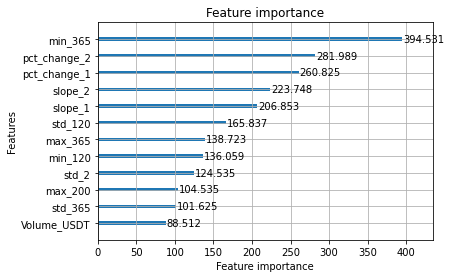

In [ ]:
pd_importances = pd.DataFrame({'feature': X_train.columns,'importance': modelo_baja.feature_importances_}).sort_values('importance', ascending = False)
lgb.plot_importance(modelo_baja, importance_type = 'gain', max_num_features  = 12 )
display()

In [ ]:
# TABLA DE VALIDACION (con test)

oot_probs = pd.Series(modelo_baja.predict_proba(X_valid)[:,1],index=X_valid.index)
# Armo df sólo con probabilidad y target
oot_df_perform = pd.concat( [ y_valid, oot_probs ], axis=1)
oot_df_perform.columns = [ 'target', 'Probs']
# Genero tabla de Performance (cambiar el parámetro de rango, según la tabla que se quiera)
Tabla_Performance_OOT = gen_val_table_10_rangs('Performance', oot_df_perform, 'target', 'Probs', 10)
Tabla_Performance_OOT

Out[183]:

,rango,score_tr,Total,%Total,CUM %Total,#BAJAS,BAJAS Rate,%BAJAS,CUM %BAJAS,#BAJAS_Acum,#no_bajas,no_bajas Rate,%no_bajas,CUM %no_bajas,#no_bajas_Acum,KS,Odds,Odds_Acum
9,10,"(0.582, 0.727]",702,0.1,1.0,391,0.56,0.123,1.000,3178,311,0.44,0.081,1.000,3842,0.000,0.795,1.209
8,9,"(0.543, 0.582]",702,0.1,0.9,387,0.55,0.122,0.877,2787,315,0.45,0.082,0.919,3531,0.042,0.814,1.267
7,8,"(0.511, 0.543]",702,0.1,0.8,383,0.55,0.121,0.755,2400,319,0.45,0.083,0.837,3216,0.082,0.833,1.340
6,7,"(0.482, 0.511]",702,0.1,0.7,343,0.49,0.108,0.634,2017,359,0.51,0.093,0.754,2897,0.120,1.047,1.436
5,6,"(0.454, 0.482]",702,0.1,0.6,333,0.47,0.105,0.526,1674,369,0.53,0.096,0.661,2538,0.135,1.108,1.516
4,5,"(0.426, 0.454]",702,0.1,0.5,325,0.46,0.102,0.421,1341,377,0.54,0.098,0.565,2169,0.144,1.160,1.617
3,4,"(0.398, 0.426]",702,0.1,0.4,314,0.45,0.099,0.319,1016,388,0.55,0.101,0.467,1792,0.148,1.236,1.764
2,3,"(0.364, 0.398]",702,0.1,0.3,303,0.43,0.095,0.220,702,399,0.57,0.104,0.366,1404,0.146,1.317,2.000
1,2,"(0.309, 0.364]",702,0.1,0.2,306,0.44,0.096,0.125,399,396,0.56,0.103,0.262,1005,0.137,1.294,2.519
0,1,"(0.0719, 0.309]",702,0.1,0.1,93,0.13,0.029,0.029,93,609,0.87,0.159,0.159,609,0.130,6.548,6.548


In [ ]:
import plotly.express as px

df_probs = pd.concat([valid_probs,y_valid],axis=1)
df_probs.columns = ['prob','target']

px.violin(df_probs, y="prob", 
          #x="target",
                violinmode='overlay',color='target', # draw violins on top of each other
                hover_data=df_probs.columns)


Out[184]:

In [ ]:
df_probs[df_probs.prob>=0.6].target.value_counts()

Out[185]: 1 267
0 213
Name: target, dtype: int64

In [ ]:
df_probs[df_probs.prob>=0.6].sort_values('prob',ascending=False)

Out[186]:

,prob,target
date,,
2017-11-12 10-AM,0.727281,1
2018-02-15 07-AM,0.727219,0
2018-01-31 07-AM,0.717211,1
2018-09-11 09-PM,0.714379,1
2018-11-22 09-PM,0.714339,1
...,...,...
2018-08-13 03-AM,0.600386,1
2018-07-13 03-AM,0.600303,1
2020-04-30 05-AM,0.600269,1


In [ ]:
menores_probs = df_probs.sort_values('prob',ascending=True).head(30).merge(df_iguales[['close','close_next']],
        how='left', left_index=True, right_index=True)

menores_probs['es_igual'] = np.where(menores_probs.close == menores_probs.close_next, 1, 0)
menores_probs

Out[225]:

,prob,target,close,close_next,es_igual
date,,,,,
2020-10-17 03-PM,0.033292,0,11337.54,11337.54,1
2020-10-19 12-AM,0.035990,0,11469.34,11469.34,1
2020-10-10 10-AM,0.036693,0,11314.10,11314.10,1
2020-09-30 05-AM,0.036955,0,10698.66,10698.66,1
2020-10-12 08-AM,0.037386,0,11358.80,11358.80,1
2020-09-29 04-PM,0.037438,0,10692.39,10692.39,1
2020-09-26 05-AM,0.037880,0,10727.14,10727.14,1
2020-10-12 11-PM,0.038258,0,11528.25,11528.25,1
2020-10-10 09-AM,0.038283,0,11317.27,11317.27,1


## Interpretabilidad - Shap

In [ ]:
explainer = shap.TreeExplainer(modelo_baja)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2675033323409777> in <module> 
 ----> 1 explainer = shap . TreeExplainer ( modelo ) 
 2 shap_values = explainer . shap_values ( X_test ) 
 3 
 4 shap . summary_plot ( shap_values , X_test ) 

 NameError : name 'shap' is not defined

In [ ]:
# compute SHAP values
explainer = shap.Explainer(modelo_baja, X_test)
shap_values = explainer(X_test)

shap.plots.beeswarm(shap_values,max_display=30)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-327209449537400> in <module> 
 1 # compute SHAP values 
 ----> 2 explainer = shap . Explainer ( modelo , X_test ) 
 3 shap_values = explainer ( X_test ) 
 4 
 5 shap . plots . beeswarm ( shap_values , max_display = 30 ) 

 NameError : name 'shap' is not defined

# Evaluacion binaria conjunta

La idea es ver para los mismos casos como los modelos predicen. Cuando uno es chico el otro tiene que ser grande (correlacion negativa)

In [ ]:
probs_BAJA = pd.DataFrame(probs_BAJA,columns=['prob_BAJA'])
probs_SUBA = pd.DataFrame(probs_SUBA,columns=['prob_SUBA'])

probs_SUBA_BAJA = pd.concat([probs_SUBA,probs_BAJA],axis=1)
probs_SUBA_BAJA

Out[187]:

,prob_SUBA,prob_BAJA
date,,
2018-10-14 10-PM,0.543928,0.470701
2018-12-21 06-PM,0.539921,0.377856
2020-03-30 03-AM,0.379802,0.491696
2018-08-04 12-AM,0.473126,0.577015
2018-09-01 03-PM,0.491730,0.463931
...,...,...
2018-02-07 11-PM,0.570960,0.367821
2019-06-29 06-PM,0.542599,0.546006
2021-02-01 12:00:00,0.589738,0.413779


Out[188]:

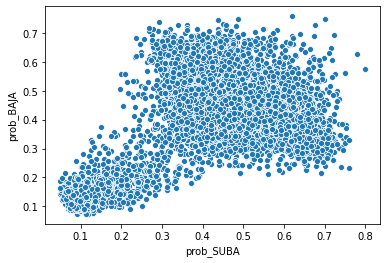

<matplotlib.axes._subplots.AxesSubplot at 0x7fbb004c1dc0>

In [ ]:
sns.scatterplot(data=probs_SUBA_BAJA, x="prob_SUBA", y="prob_BAJA")

In [ ]:
probs_SUBA_BAJA.sort_values('prob_SUBA',ascending=False)

Out[189]:

,prob_SUBA,prob_BAJA
date,,
2020-06-28 02-AM,0.798114,0.576810
2020-06-28 03-AM,0.778551,0.627669
2020-05-05 02-AM,0.759541,0.330121
2019-05-24 02-AM,0.758834,0.232705
2019-06-26 09-AM,0.753471,0.382646
...,...,...
2020-08-23 03-PM,0.051588,0.147159
2020-09-19 10-AM,0.051172,0.161146
2020-08-16 03-AM,0.050093,0.164338


In [ ]:
# pruebo con 0.01 (van a quedar pocos positivos y negativos)
max_threshold = 0.00
min_threshold = -0.00

#y_train = pd.DataFrame(y_train_base)
#y_train[TARGET] = np.where(y_train.pct_change_next > max_threshold, 1, np.where(y_train.pct_change_next < max_threshold, -1, 0))
#y_train = y_train[TARGET]

y_valid = pd.DataFrame(y_valid_base)
y_valid[TARGET] = np.where(y_valid.pct_change_next > max_threshold, 1, np.where(y_valid.pct_change_next < min_threshold, -1, 0))
y_valid = y_valid[TARGET]

y_test = pd.DataFrame(y_test_base)
y_test[TARGET] = np.where(y_test.pct_change_next > max_threshold, 1, np.where(y_test.pct_change_next < min_threshold, -1, 0))
y_test = y_test[TARGET]


targets_trinario = pd.concat([y_test,y_valid])
#targets_trinario = pd.concat([targets_trinario,y_train])
targets_trinario = pd.DataFrame(targets_trinario)

In [ ]:
targets_trinario

Out[191]:

,TARGET
date,
2018-10-14 10-PM,-1
2018-12-21 06-PM,-1
2020-03-30 03-AM,1
2018-08-04 12-AM,1
2018-09-01 03-PM,1
...,...
2018-02-07 11-PM,1
2019-06-29 06-PM,-1
2021-02-01 12:00:00,-1


In [ ]:
probs_SUBA_BAJA_TARGET = pd.concat([probs_SUBA_BAJA,targets_trinario],axis=1)
probs_SUBA_BAJA_TARGET.sample(15)

Out[192]:

,prob_SUBA,prob_BAJA,TARGET
date,,,
2020-06-20 12-PM,0.527291,0.507039,-1
2019-01-27 07-PM,0.435030,0.534571,1
2021-01-18 07:00:00,0.461134,0.457615,1
2018-03-25 05-PM,0.382975,0.578119,1
2019-10-04 10-PM,0.523329,0.526002,-1
2019-02-22 02-AM,0.409371,0.523644,-1
2019-10-03 02-PM,0.609732,0.361568,1
2019-07-29 08-PM,0.439512,0.442104,-1
2018-09-04 03-PM,0.423479,0.517381,1


In [ ]:
probs_SUBA_BAJA_TARGET['diferencia_probs'] = probs_SUBA_BAJA_TARGET.prob_SUBA - probs_SUBA_BAJA_TARGET.prob_BAJA
probs_SUBA_BAJA_TARGET['decision_SUBA'] = np.where(probs_SUBA_BAJA_TARGET.diferencia_probs > 0, 1, np.where(probs_SUBA_BAJA_TARGET.diferencia_probs < 0, -1, 0))

In [ ]:
punto_corte_SUBA = 0.6
punto_corte_BAJA = 0.6
probs_SUBA_BAJA_TARGET['decision_SUBA'] = np.where(probs_SUBA_BAJA_TARGET.prob_SUBA > punto_corte_SUBA, 1, 0)
probs_SUBA_BAJA_TARGET['decision_BAJA'] = np.where(probs_SUBA_BAJA_TARGET.prob_BAJA > punto_corte_BAJA, 1, 0)
probs_SUBA_BAJA_TARGET['hay_decision'] = np.where((probs_SUBA_BAJA_TARGET.decision_SUBA == 1) | (probs_SUBA_BAJA_TARGET.decision_BAJA == 1), 1, 0)
probs_SUBA_BAJA_TARGET['coinciden_decision'] = np.where((probs_SUBA_BAJA_TARGET.decision_SUBA == 1) & (probs_SUBA_BAJA_TARGET.decision_SUBA == 1), 1, 0)

In [ ]:
probs_SUBA_BAJA_TARGET['decision_FINAL'] = np.where((probs_SUBA_BAJA_TARGET.coinciden_decision == 0) & (probs_SUBA_BAJA_TARGET.decision_SUBA == 1), 1,
                                           np.where((probs_SUBA_BAJA_TARGET.coinciden_decision == 0) & (probs_SUBA_BAJA_TARGET.decision_BAJA == 1), -1, None))
probs_SUBA_BAJA_TARGET

Out[195]:

,prob_SUBA,prob_BAJA,TARGET,diferencia_probs,decision_SUBA,decision_BAJA,hay_decision,coinciden_decision,decision_FINAL
date,,,,,,,,,
2018-10-14 10-PM,0.543928,0.470701,-1,0.073228,0,0,0,0,None
2018-12-21 06-PM,0.539921,0.377856,-1,0.162065,0,0,0,0,None
2020-03-30 03-AM,0.379802,0.491696,1,-0.111895,0,0,0,0,None
2018-08-04 12-AM,0.473126,0.577015,1,-0.103889,0,0,0,0,None
2018-09-01 03-PM,0.491730,0.463931,1,0.027799,0,0,0,0,None
...,...,...,...,...,...,...,...,...,...
2018-02-07 11-PM,0.570960,0.367821,1,0.203139,0,0,0,0,None
2019-06-29 06-PM,0.542599,0.546006,-1,-0.003407,0,0,0,0,None
2021-02-01 12:00:00,0.589738,0.413779,-1,0.175959,0,0,0,0,None


In [ ]:
probs_SUBA_BAJA_TARGET['ACIERTO'] = np.where(probs_SUBA_BAJA_TARGET.decision_FINAL == None, None,
        np.where(probs_SUBA_BAJA_TARGET.decision_FINAL == probs_SUBA_BAJA_TARGET.TARGET,1,0))
probs_SUBA_BAJA_TARGET

Out[196]:

,prob_SUBA,prob_BAJA,TARGET,diferencia_probs,decision_SUBA,decision_BAJA,hay_decision,coinciden_decision,decision_FINAL,ACIERTO
date,,,,,,,,,,
2018-10-14 10-PM,0.543928,0.470701,-1,0.073228,0,0,0,0,None,0
2018-12-21 06-PM,0.539921,0.377856,-1,0.162065,0,0,0,0,None,0
2020-03-30 03-AM,0.379802,0.491696,1,-0.111895,0,0,0,0,None,0
2018-08-04 12-AM,0.473126,0.577015,1,-0.103889,0,0,0,0,None,0
2018-09-01 03-PM,0.491730,0.463931,1,0.027799,0,0,0,0,None,0
...,...,...,...,...,...,...,...,...,...,...
2018-02-07 11-PM,0.570960,0.367821,1,0.203139,0,0,0,0,None,0
2019-06-29 06-PM,0.542599,0.546006,-1,-0.003407,0,0,0,0,None,0
2021-02-01 12:00:00,0.589738,0.413779,-1,0.175959,0,0,0,0,None,0


In [ ]:
probs_SUBA_BAJA_TARGET.groupby(['decision_SUBA','decision_BAJA','TARGET']).size().to_frame('cantidad').reset_index()

Out[197]:

,decision_SUBA,decision_BAJA,TARGET,cantidad
0,0,0,-1,4871
1,0,0,0,1105
2,0,0,1,5019
3,0,1,-1,548
4,0,1,0,4
5,0,1,1,376
6,1,0,-1,866
7,1,0,0,10
8,1,0,1,1209
9,1,1,-1,12


In [ ]:
print('Porcentaje de ACCIONES SUBA correctos: %', round(len(probs_SUBA_BAJA_TARGET[(probs_SUBA_BAJA_TARGET.decision_SUBA == 1) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 0) &
                                (probs_SUBA_BAJA_TARGET.TARGET == 1)]) / \
      len(probs_SUBA_BAJA_TARGET[(probs_SUBA_BAJA_TARGET.decision_SUBA == 1) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 0)]) *100, 2))

      
print('Porcentaje de ACCIONES BAJA correctos: %', round(len(probs_SUBA_BAJA_TARGET[(probs_SUBA_BAJA_TARGET.decision_SUBA == 0) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 1) &
                                (probs_SUBA_BAJA_TARGET.TARGET == -1)]) / \
      len(probs_SUBA_BAJA_TARGET[(probs_SUBA_BAJA_TARGET.decision_SUBA == 0) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 1)]) *100, 2))

print('Porcentaje de ACCIONES sobre el total: %', round((
len(probs_SUBA_BAJA_TARGET[(probs_SUBA_BAJA_TARGET.decision_SUBA == 1) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 0)]) + 
len(probs_SUBA_BAJA_TARGET[(probs_SUBA_BAJA_TARGET.decision_SUBA == 0) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 1)])) /len(probs_SUBA_BAJA_TARGET) *100, 2))

Porcentaje de ACCIONES SUBA correctos: % 57.99
Porcentaje de ACCIONES BAJA correctos: % 59.05
Porcentaje de ACCIONES sobre el total: % 21.46

In [ ]:
probs_SUBA_BAJA_TARGET = probs_SUBA_BAJA_TARGET.merge(df[['pct_change_next']],left_index=True,right_index=True,how='inner')

In [ ]:
print('Promedio de cambios porcentuales con ACCION SUBA %',round(probs_SUBA_BAJA_TARGET[(probs_SUBA_BAJA_TARGET.decision_SUBA == 1) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 0)].pct_change_next.mean()*100,3))
print('Promedio de cambios porcentuales con ACCION BAJA %',round(probs_SUBA_BAJA_TARGET[(probs_SUBA_BAJA_TARGET.decision_SUBA == 0) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 1)].pct_change_next.mean()*100,3))

Promedio de cambios porcentuales con ACCION SUBA % 0.081
Promedio de cambios porcentuales con ACCION BAJA % -0.031

In [ ]:
print('Ganancia esperada (en cambio porcentual) %', 
      abs(probs_SUBA_BAJA_TARGET[((probs_SUBA_BAJA_TARGET.decision_SUBA == 1) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 0))
                            |
                            ((probs_SUBA_BAJA_TARGET.decision_SUBA == 1) & 
                                (probs_SUBA_BAJA_TARGET.decision_BAJA == 0))].pct_change_next).sum())

Ganancia esperada (en cambio porcentual) % 12.169155462753398

In [ ]:
len(probs_SUBA_BAJA_TARGET)/24

Out[223]: 585.0

In [ ]:
#import plotly.express as px


#px.violin(probs_SUBA_BAJA_TARGET, y="diferencia_probs", x="TARGET",
#                violinmode='overlay',color='ACIERTO', 
#                hover_data=probs_SUBA_BAJA_TARGET.columns)

# Clasificacion multiclase

https://nitin9809.medium.com/lightgbm-binary-classification-multi-class-classification-regression-using-python-4f22032b36a2

### Construir TARGET

El target debe construirse con el valor de CLOSE del SIGUIENTE DIA

In [ ]:
df['close_next'] = df.close.shift(-1)
df['pct_change_next'] = (df.close_next - df.close) / df.close
df[['close','close_next','pct_change_next','pct_change_1','slope_1']].head(20)

Out[31]:

,close,close_next,pct_change_next,pct_change_1,slope_1
date,,,,,
2019-05-19 02-PM,7922.63,7962.78,0.005068,0.009374,73.58
2019-05-19 03-PM,7962.78,7907.40,-0.006955,0.005068,40.15
2019-05-19 04-PM,7907.40,7969.93,0.007908,-0.006955,-55.38
2019-05-19 05-PM,7969.93,7974.23,0.000540,0.007908,62.53
2019-05-19 06-PM,7974.23,7952.48,-0.002728,0.000540,4.30
2019-05-19 07-PM,7952.48,8010.51,0.007297,-0.002728,-21.75
2019-05-19 08-PM,8010.51,8057.33,0.005845,0.007297,58.03
2019-05-19 09-PM,8057.33,8188.72,0.016307,0.005845,46.82
2019-05-19 10-PM,8188.72,8148.48,-0.004914,0.016307,131.39


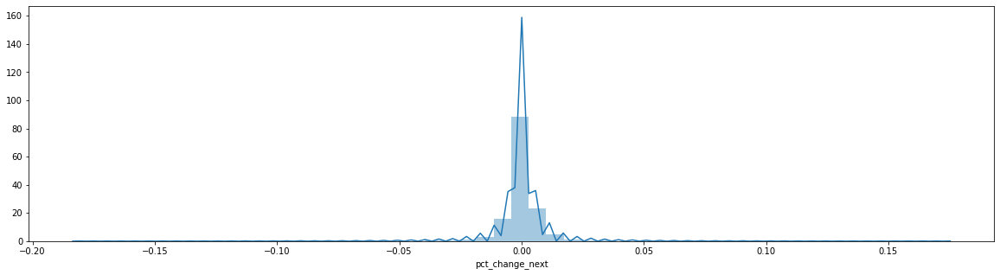

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize = (20,5))

sns.distplot(df.pct_change_next)
plt.show()

In [ ]:
df.pct_change_next.describe()

Out[38]: count 19997.000000
mean 0.000129
std 0.007830
min -0.182115
25% -0.002155
50% 0.000000
75% 0.002436
max 0.173840
Name: pct_change_next, dtype: float64

In [ ]:
# pruebo con 0.01 (van a quedar pocos positivos y negativos)
min_threshold = -0.005
max_threshold = 0.005

TARGET = 'TARGET'
df[TARGET] = np.where(df.pct_change_next > max_threshold, 1, np.where(df.pct_change_next < min_threshold, -1, 0))


In [ ]:
df[['close','close_next','pct_change_next','TARGET']].sample(20)

Out[44]:

,close,close_next,pct_change_next,TARGET
date,,,,
2021-03-27 15:00:00,54961.85,56167.46,0.021935,1
2020-05-13 04-PM,9111.20,9085.27,-0.002846,0
2019-10-31 10-PM,9122.69,9140.85,0.001991,0
2020-03-25 08-PM,6591.38,6599.95,0.001300,0
2020-06-28 01-AM,8971.80,8971.80,0.000000,0
2021-02-19 08:00:00,52236.31,52690.70,0.008699,1
2020-03-05 11-PM,9054.68,8990.00,-0.007143,-1
2020-05-24 09-AM,9270.73,9263.40,-0.000791,0
2019-07-02 04-PM,10510.69,10772.34,0.024894,1


In [ ]:
df.TARGET.value_counts()

Out[45]: 0 14685
 1 2801
-1 2512
Name: TARGET, dtype: int64

In [ ]:
# saco el ultimo

df = df.iloc[:-1,:].drop(columns='close_next')

In [ ]:
df[['close','pct_change_1','slope_1',TARGET]].tail(20)

Out[270]:

,close,pct_change_1,slope_1,SUBE_PRECIO
date,,,,
2021-05-11 04:00:00,55337.04,0.003529,194.58,0
2021-05-11 05:00:00,54798.00,-0.009741,-539.04,1
2021-05-11 06:00:00,55677.12,0.016043,879.12,1
2021-05-11 07:00:00,55740.09,0.001131,62.97,0
2021-05-11 08:00:00,55341.27,-0.007155,-398.82,1
2021-05-11 09:00:00,55901.15,0.010117,559.88,0
2021-05-11 10:00:00,55841.78,-0.001062,-59.37,0
2021-05-11 11:00:00,55210.47,-0.011305,-631.31,1
2021-05-11 12:00:00,55374.08,0.002963,163.61,1


In [ ]:
#df.reset_index().loc[5000:5050,['date','close',TARGET]]

In [ ]:
#pd.to_datetime(df.reset_index().date)

## Train Test Split

In [ ]:
# Separo en Train y Test


train1, test = model_selection.train_test_split(df, test_size=0.2, stratify=df[TARGET], random_state=10)
train, valid = model_selection.train_test_split(train1, test_size=0.25, stratify=train1[TARGET], random_state=10)

X_train = train.drop([ TARGET ], axis=1) 
y_train = train[TARGET]

X_valid = valid.drop([ TARGET ], axis=1) 
y_valid = valid[TARGET]

X_test = test.drop([ TARGET ], axis=1) 
y_test = test[TARGET]

print(X_train.shape)
print(X_valid.shape)
print(X_test.shape)

print(y_train.value_counts())
print(y_valid.value_counts())
print(y_test.value_counts())

(11997, 112)
(4000, 112)
(4000, 112)
 0 8810
 1 1680
-1 1507
Name: TARGET, dtype: int64
 0 2937
 1 561
-1 502
Name: TARGET, dtype: int64
 0 2937
 1 560
-1 503
Name: TARGET, dtype: int64

In [ ]:
space = {
  'params':
  {
  'learning_rate': 0.01,
  'num_leaves': 10,
  'n_estimators': 50,
  'max_depth': 10,
  'bagging_fraction': 0.4,
  'feature_fraction':  0.7,
  
  'min_child_samples':100
  },
  
  'trainParams':
  {
  "early_stopping_rounds": 5,
  "eval_metric": "auc", 
  "eval_set": False,
    'verbose':0
  },
  
  'folds': folds
}

objective(space)

PARAMS {'learning_rate': 0.01, 'num_leaves': 10, 'n_estimators': 50, 'max_depth': 10, 'bagging_fraction': 0.4, 'feature_fraction': 0.7, 'min_child_samples': 100}
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7

--------------------------------------------------------------------------- 
 Exception Traceback (most recent call last)
 <command-1571028529351361> in <module> 
 23 }
 24 
 ---> 25 objective ( space ) 

 <command-1571028529351362> in objective (PARAMETERS) 
 33 
 34 # Armo Predicciones de probabilidad y Labels para base de Validacion y Test 
 ---> 35 probs = pd . Series ( learner . predict_proba ( Xv ) ) . reset_index ( drop = True ) 
 36 probs_ap = pd . Series ( learner . predict_proba ( Xv ) [ : , - 1 ] , index = Xv . index , name = "prob_val" ) 
 37 print ( 'shape de predict_proba:' , probs . shape ) 

 /databricks/python/lib/python3.8/site-packages/pandas/core/series.py in __init__ (self, data, index, dtype, name, copy, fastpath) 
 325 data = data . copy ( ) 
 326 else : 
 --> 327 data = sanitize_array ( data , index , dtype , copy , raise_cast_failure = True ) 
 328 
 329 data = SingleBlockManager . from_array ( data , index ) 

 /databricks/python/lib/python3.8/site-packages/pandas/core/construction.py in sanitize_array (data, index, dtype, copy, raise_cast_failure) 
 494 elif subarr . ndim > 1 : 
 495 if isinstance ( data , np . ndarray ) : 
 --> 496 raise Exception ( "Data must be 1-dimensional" ) 
 497 else : 
 498 subarr = com . asarray_tuplesafe ( data , dtype = dtype ) 

 Exception : Data must be 1-dimensional

In [ ]:

def objective(PARAMETERS):

  params = PARAMETERS['params']
  folds = PARAMETERS['folds']
  
  auc_cv = []
  ks_cv = []
  
  
  with mlflow.start_run(run_name=runname, nested=True):
    
    mlflow.log_params(params)
    #mlflow.log_params(trainParams)
    print('PARAMS',params)
    #print('TRAIN PARAMS',trainParams)
    mlflow.set_tag('cantidad_row',len(df))

    # Bucle que itera entre Folds del CrossValidation
    for i, (train_idx, valid_idx) in enumerate(folds):
      Xt = X_train.iloc[train_idx]
      yt = y_train.loc[X_train.index].iloc[train_idx]

      Xv = X_train.iloc[valid_idx]
      yv = y_train.loc[X_train.index].iloc[valid_idx]
      
      
      # ARMADO DEL MODELO
      learner = lgb.LGBMClassifier(**params, 
                                   objective='multiclass',
                                   metric='multi_logloss',
                                   num_class=3)
      learner.fit(Xt, yt)

      # Armo Predicciones de probabilidad y Labels para base de Validacion y Test
      probs = pd.Series(learner.predict_proba(Xv)).reset_index(drop=True)
      probs_ap = pd.Series(learner.predict_proba(Xv)[:, -1], index=Xv.index, name="prob_val")
      print('shape de predict_proba:', probs.shape)
      print('PROBS que salen de predict_proba:', probs)
      
      if i == 0:
        probs_cv = probs_ap
      else:
        probs_cv = pd.concat([probs_cv,probs_ap])
      
      # METRICAS del fold
      yv = yv.reset_index(drop=True)
      auc_cv.append(roc_auc_score(yv, probs))
      ks_cv.append(ks_2samp(probs[yv==1], probs[yv==0]).statistic)
      
      #print(f'\n-----------------------------------\nFIN ITERACION {i} \n------------------------------------')
    
    
    # METRICAS DE TODOS LOS FOLDS (aca deberia en vez de promediar, concat las probs y sacar las metricas con todos)
    print('TERMINARON TODAS LAS ITERACIONES')
    auc  = np.array(auc_cv).mean()
    #print('AUC MEAN',auc)
    ks = np.array(ks_cv).mean()
    #print('KS MEAN',ks)
    mlflow.log_metric('ks_cv_mean',ks)
    mlflow.log_metric('auc_cv_mean',auc)
    
    
    # metricas de los folds concatenados
    #auc_train = roc_auc_score(y_train, probs_cv)
    #print('AUC_TRAIN',auc_train)
    #ks_train = ks_2samp(probs_cv[y_train==1], probs_cv[y_train!=1]).statistic
    #print('KS_TRAIN',ks_train)
    #mlflow.log_metric('auc_train',auc_train)
    #mlflow.log_metric('ks_train',ks_train)
    
    
    # entreno de nuevo el modelo con todos los datos de train
    learner = lgb.LGBMClassifier(**params)
    learner.fit(X_train, y_train) #, **trainParams)
    mlflow.lightgbm.log_model(learner.booster_, 'HYPEROPT')
    
    # metricas de train
    train_probs = pd.Series(learner.predict_proba(X_train)[:,-1], index=X_train.index)
    auc_train = roc_auc_score(y_train, train_probs)
    print('AUC_TRAIN',auc_train)
    ks_train = ks_2samp(train_probs[y_train==1], train_probs[y_train!=1]).statistic
    print('KS_TRAIN',ks_train)
    mlflow.log_metric('auc_train',auc_train)
    mlflow.log_metric('ks_train',ks_train)
    
    # metricas de evaluacion
    valid_probs = pd.Series(learner.predict_proba(X_valid)[:,-1], index=X_valid.index)
    auc_valid = roc_auc_score(y_valid, valid_probs)
    print('AUC_VALID',auc_valid)
    ks_valid = ks_2samp(valid_probs[y_valid==1], valid_probs[y_valid!=1]).statistic
    print('KS_VALID',ks_valid)
    mlflow.log_metric('auc_valid',auc_valid)
    mlflow.log_metric('ks_valid',ks_valid)
    
    # metricas de test
    test_probs = pd.Series(learner.predict_proba(X_test)[:,-1],index=X_test.index)
    auc_test = roc_auc_score(y_test, test_probs)
    print('AUC_TEST',auc_test)
    ks_test = ks_2samp(test_probs[y_test==1], test_probs[y_test!=1]).statistic
    print('KS_TEST',ks_test)
    mlflow.log_metric('auc_test',auc_test)
    mlflow.log_metric('ks_test',ks_test)    
    
    #print('test_probs (probs de 1):',test_probs)
    
    mlflow.log_metric('dif_ks_train_test', abs(ks_train - ks_test))

    return {'loss': -ks, 'status': STATUS_OK}


In [ ]:
from sklearn import model_selection

folds = list(model_selection.StratifiedKFold(n_splits=4, shuffle=True, random_state=42).split(X_train, y_train))

space = {
  'params':
  {
  'learning_rate': hp.uniform('learning_rate', 0.001, 0.5),
  'num_leaves': hp.choice('num_leaves',range(2,5000,1)),
  'n_estimators': hp.choice('n_estimators',range(1,300,1)),
  'max_depth': hp.choice('max_depth', range(1,30,1)),
  #'bagging_fraction': hp.uniform('bagging_fraction', 0, 1),
  #'feature_fraction':  hp.uniform('feature_fraction', 0, 1),
  
  'min_child_samples': hp.choice('min_child_samples', range(30,180,1)),
 # 'min_data_in_leaf': hp.choice('min_data_in_leaf', range(0.01*train.shape[0], 0.5*train.shape[0],1)),
  
  'colsample_bytree':  hp.uniform('colsample_bytree', 0.2, 1.0),
  'min_child_weight':  hp.uniform('min_child_weight', 0.01, 1.0),
  
  'reg_alpha': hp.choice('reg_alpha', range(0,20,1)),
  'reg_lambda': hp.uniform('reg_lambda', 0,5),
  },
  
#  'trainParams':
#  {
#  "early_stopping_rounds": 5,
#  "eval_metric": "auc", 
#  "eval_set": True,
#    'verbose':0
#  },
#  
  'folds': folds
}


In [ ]:
EVALUACIONES = 2
#CV_usar = 3
n_trials = 4
intento += 1
  
#spark_trials = SparkTrials(n_trials)
runname = 'ETH_'+str(intento)
#mlflow.sklearn.autolog()

# Optimazation part
with mlflow.start_run(run_name=runname):
  spark_trials_run_id = mlflow.active_run().info.run_id
  argmin = fmin(
      fn=objective, 
      space=space,
      algo=tpe.suggest,
      max_evals=EVALUACIONES,
    #  trials=spark_trials,
   # verbose=1
  )


0%| | 0/2 [00:00<?, ?trial/s, best loss=?] PARAMS
 0%| | 0/2 [00:01<?, ?trial/s, best loss=?] {'colsample_bytree': 0.5244174467036975, 'learning_rate': 0.24442773456499495, 'max_depth': 27, 'min_child_samples': 47, 'min_child_weight': 0.4925531697861731, 'n_estimators': 94, 'num_leaves': 3222, 'reg_alpha': 0, 'reg_lambda': 3.9473647846664233}
 0%| | 0/2 [00:01<?, ?trial/s, best loss=?] PROBS que salen de predict_proba:
 0%| | 0/2 [00:03<?, ?trial/s, best loss=?] 0 0.000003
1 0.000068
2 0.998893
3 0.000064
4 0.000006
 ... 
2995 0.000005
2996 0.000002
2997 0.000005
2998 0.000039
2999 0.000165
Length: 3000, dtype: float64
 0%| | 0/2 [00:03<?, ?trial/s, best loss=?] job exception: multi_class must be in ('ovo', 'ovr')

 0%| | 0/2 [00:04<?, ?trial/s, best loss=?] 0%| | 0/2 [00:04<?, ?trial/s, best loss=?]

--------------------------------------------------------------------------- 
 ValueError Traceback (most recent call last)
 <command-1571028529351364> in <module> 
 11 with mlflow . start_run ( run_name = runname ) : 
 12 spark_trials_run_id = mlflow . active_run ( ) . info . run_id
 ---> 13 argmin = fmin(
 14 fn = objective , 
 15 space = space , 

 /local_disk0/.ephemeral_nfs/envs/pythonEnv-90904bdb-9981-419e-bb65-710237b578b2/lib/python3.8/site-packages/hyperopt/fmin.py in fmin (fn, space, algo, max_evals, timeout, loss_threshold, trials, rstate, allow_trials_fmin, pass_expr_memo_ctrl, catch_eval_exceptions, verbose, return_argmin, points_to_evaluate, max_queue_len, show_progressbar, early_stop_fn, trials_save_file) 
 551 
 552 # next line is where the fmin is actually executed 
 --> 553 rval . exhaust ( ) 
 554 
 555 if return_argmin : 

 /local_disk0/.ephemeral_nfs/envs/pythonEnv-90904bdb-9981-419e-bb65-710237b578b2/lib/python3.8/site-packages/hyperopt/fmin.py in exhaust (self) 
 354 def exhaust ( self ) : 
 355 n_done = len ( self . trials ) 
 --> 356 self . run ( self . max_evals - n_done , block_until_done = self . asynchronous ) 
 357 self . trials . refresh ( ) 
 358 return self

 /local_disk0/.ephemeral_nfs/envs/pythonEnv-90904bdb-9981-419e-bb65-710237b578b2/lib/python3.8/site-packages/hyperopt/fmin.py in run (self, N, block_until_done) 
 290 else : 
 291 # -- loop over trials and do the jobs directly 
 --> 292 self . serial_evaluate ( ) 
 293 
 294 self . trials . refresh ( ) 

 /local_disk0/.ephemeral_nfs/envs/pythonEnv-90904bdb-9981-419e-bb65-710237b578b2/lib/python3.8/site-packages/hyperopt/fmin.py in serial_evaluate (self, N) 
 168 ctrl = base . Ctrl ( self . trials , current_trial = trial ) 
 169 try : 
 --> 170 result = self . domain . evaluate ( spec , ctrl ) 
 171 except Exception as e : 
 172 logger . error ( "job exception: %s" % str ( e ) ) 

 /local_disk0/.ephemeral_nfs/envs/pythonEnv-90904bdb-9981-419e-bb65-710237b578b2/lib/python3.8/site-packages/hyperopt/base.py in evaluate (self, config, ctrl, attach_attachments) 
 905 print_node_on_error = self . rec_eval_print_node_on_error , 
 906 )
 --> 907 rval = self . fn ( pyll_rval ) 
 908 
 909 if isinstance ( rval , ( float , int , np . number ) ) : 

 <command-1571028529351362> in objective (PARAMETERS) 
 44 # METRICAS del fold 
 45 yv = yv . reset_index ( drop = True ) 
 ---> 46 auc_cv . append ( roc_auc_score ( yv , probs ) ) 
 47 ks_cv . append ( ks_2samp ( probs [ yv == 1 ] , probs [ yv == 0 ] ) . statistic ) 
 48 

 /databricks/python/lib/python3.8/site-packages/sklearn/utils/validation.py in inner_f (*args, **kwargs) 
 70 FutureWarning)
 71 kwargs . update ( { k : arg for k , arg in zip ( sig . parameters , args ) } ) 
 ---> 72 return f ( ** kwargs ) 
 73 return inner_f
 74 

 /databricks/python/lib/python3.8/site-packages/sklearn/metrics/_ranking.py in roc_auc_score (y_true, y_score, average, sample_weight, max_fpr, multi_class, labels) 
 382 "instead".format(max_fpr))
 383 if multi_class == 'raise' : 
 --> 384 raise ValueError ( "multi_class must be in ('ovo', 'ovr')" ) 
 385 return _multiclass_roc_auc_score(y_true, y_score, labels,
 386 multi_class, average, sample_weight)

 ValueError : multi_class must be in ('ovo', 'ovr')

## Mejor modelo

In [ ]:
#runname = 'lgbm-hyperopt_'+str(intento)

runs = mlflow.search_runs().sort_values('metrics.ks_valid', ascending=False)
runs = runs[runs['tags.mlflow.runName'] == runname]
runs[['run_id','metrics.ks_valid','metrics.ks_test','metrics.ks_train','metrics.auc_valid','metrics.auc_test','metrics.auc_train']].head(15)

Out[285]:

,run_id,metrics.ks_valid,metrics.ks_test,metrics.ks_train,metrics.auc_valid,metrics.auc_test,metrics.auc_train
8,6e692282bb7641e38af5e4dd9fbe5973,0.270834,0.236754,0.481004,0.659708,0.649438,0.823840
16,0e9596541ef741e1802a3cd7a056f0ad,0.267676,0.248229,0.462451,0.658462,0.651808,0.814122
12,374d5b7af26b4304ba0e92f2043342dd,0.264974,0.226979,0.661198,0.658867,0.646115,0.912751
6,9bb7d2b56e7343e886768e931bf94302,0.264971,0.242294,0.345411,0.657342,0.653487,0.731573
11,c51bc0769676493082e1677cb4aa30be,0.264637,0.236871,0.561772,0.657116,0.650574,0.865711
17,f7656fc1ff594b97bb7986b8afdd2592,0.262719,0.236069,0.619752,0.659674,0.650010,0.894548
5,1b2c29c535524fe7a46fef18808d60e3,0.260132,0.233843,0.607192,0.655530,0.648901,0.887610
2,2912a046f09b44a99cf5284d109d207d,0.257330,0.235958,0.661983,0.658705,0.648997,0.913996
9,775bd08644c54b13b94da8cacdc35faf,0.257212,0.233024,0.663593,0.657454,0.648838,0.912922
18,f52c7336b54b499a955b96880e86915e,0.256872,0.226507,0.831731,0.655053,0.646962,0.974312


## Modelo a mano

In [ ]:
logged_model = 'runs:/6e692282bb7641e38af5e4dd9fbe5973/HYPEROPT'

# Load model as a PyFuncModel.
learner = mlflow.pyfunc.load_model(logged_model)


# Predict on a Pandas DataFrame.
VALID_probs = pd.Series(learner.predict(X_valid), index=X_valid.index)

#y_valid_usar = y_valid.reset_index(drop=True)
auc_VALID = roc_auc_score(y_valid, VALID_probs)
ks_VALID = ks_2samp(VALID_probs[y_valid==1], VALID_probs[y_valid!=1]).statistic




TRAIN_probs = pd.Series(learner.predict(X_train))

y_train_usar = y_train.reset_index(drop=True)
auc_TRAIN = roc_auc_score(y_train_usar, TRAIN_probs)
ks_TRAIN = ks_2samp(TRAIN_probs[y_train_usar==1], TRAIN_probs[y_train_usar!=1]).statistic



# Predict on a Pandas DataFrame.
test_probs = pd.Series(learner.predict(X_test))

y_test_usar = y_test.reset_index(drop=True)
auc_test = roc_auc_score(y_test_usar, test_probs)
ks_test = ks_2samp(test_probs[y_test_usar==1], test_probs[y_test_usar!=1]).statistic

print('KS_TRAIN',ks_TRAIN)
print('KS_VALID',ks_VALID)
print('KS_TEST',ks_test)

print('\nAUC_TRAIN',auc_TRAIN)
print('AUC_VALID',auc_VALID)
print('AUC_TEST',auc_test)


KS_TRAIN 0.48100388426690477
KS_VALID 0.2708339450367984
KS_TEST 0.23675404660826038

AUC_TRAIN 0.8238400995074415
AUC_VALID 0.6597082655397148
AUC_TEST 0.6494384815309427

In [ ]:
import plotly.express as px

df_probs = pd.concat([VALID_probs.reset_index(drop=True),y_valid_usar],axis=1)
df_probs.columns = ['prob','target']

px.violin(df_probs, y="prob", x="target",
                violinmode='overlay',color='target', # draw violins on top of each other
                hover_data=df_probs.columns)


## Carga de hiperparametros

In [ ]:
run_id = '6e692282bb7641e38af5e4dd9fbe5973'

run = mlflow.get_run(run_id)

run_dic = run.to_dictionary()
parameters = run_dic['data']['params']


params = space['params'].keys()
#trainParams = space['trainParams'].keys()

params = {k:parameters[k] for k in params}
#trainParams = {k:parameters[k] for k in trainParams}

params = {k:eval(params[k]) for k in params}
#trainParams = {k:eval(trainParams[k]) for k in trainParams}
#trainParams['eval_metric'] = 'auc'

#Xt,Xv, yt,  yv = model_selection.train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=10)

#if "eval_set" in trainParams:
#          trainParams["eval_set"] = [(Xt, yt), (Xv, yv)]
  
learner = lgb.LGBMClassifier(**params, importance_type='gain')
learner.fit(X_train, y_train)#,**trainParams)

Out[49]: LGBMClassifier(colsample_bytree=0.8522546912408087, importance_type='gain',
 learning_rate=0.016653122674964556, max_depth=11,
 min_child_samples=153, min_child_weight=0.7276991357982967,
 n_estimators=277, num_leaves=4017, reg_alpha=11,
 reg_lambda=1.690878212726441)

In [ ]:
pd_importances = pd.DataFrame({'feature': X_train.columns,'importance': learner.feature_importances_}).sort_values('importance', ascending = False)
pd_importances.head(20)

Out[287]:

,feature,importance
16,std_2,21186.233442
99,min_200,10393.156901
106,min_365,7074.002363
10,slope_1,4388.048896
17,slope_2,2960.133541
91,max_120,2621.469764
100,std_200,2372.079592
11,pct_change_1,1781.968457
18,pct_change_2,1221.185792
4,Volume BTC,1108.324168


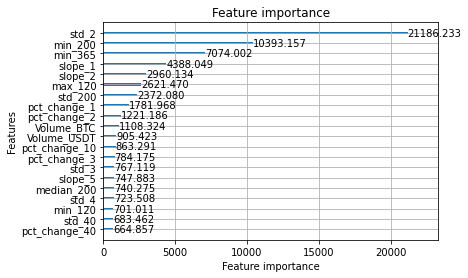

In [ ]:
lgb.plot_importance(learner, importance_type = 'gain', max_num_features  = 20 )
display()

# Regresion

https://nitin9809.medium.com/lightgbm-binary-classification-multi-class-classification-regression-using-python-4f22032b36a2

### Construir TARGET

El target debe construirse con el valor de CLOSE del SIGUIENTE DIA

In [ ]:
df['close_next'] = df.close.shift(-1)
df[['close','close_next','pct_change_1','slope_1']].head(20)

Out[267]:

,close,close_next,pct_change_1,slope_1
date,,,,
2019-05-19 02-PM,7922.63,7962.78,0.009374,73.58
2019-05-19 03-PM,7962.78,7907.40,0.005068,40.15
2019-05-19 04-PM,7907.40,7969.93,-0.006955,-55.38
2019-05-19 05-PM,7969.93,7974.23,0.007908,62.53
2019-05-19 06-PM,7974.23,7952.48,0.000540,4.30
2019-05-19 07-PM,7952.48,8010.51,-0.002728,-21.75
2019-05-19 08-PM,8010.51,8057.33,0.007297,58.03
2019-05-19 09-PM,8057.33,8188.72,0.005845,46.82
2019-05-19 10-PM,8188.72,8148.48,0.016307,131.39


In [ ]:
TARGET = 'SUBE_PRECIO'
df[TARGET] = np.where(df.close_next > df.close, 1, 0)

#df[['close','close_next','pct_change_1','slope_1',TARGET]].head(20)

In [ ]:
df = df.iloc[:-1,:].drop(columns='close_next')

In [ ]:
df[['close','pct_change_1','slope_1',TARGET]].tail(20)

Out[270]:

,close,pct_change_1,slope_1,SUBE_PRECIO
date,,,,
2021-05-11 04:00:00,55337.04,0.003529,194.58,0
2021-05-11 05:00:00,54798.00,-0.009741,-539.04,1
2021-05-11 06:00:00,55677.12,0.016043,879.12,1
2021-05-11 07:00:00,55740.09,0.001131,62.97,0
2021-05-11 08:00:00,55341.27,-0.007155,-398.82,1
2021-05-11 09:00:00,55901.15,0.010117,559.88,0
2021-05-11 10:00:00,55841.78,-0.001062,-59.37,0
2021-05-11 11:00:00,55210.47,-0.011305,-631.31,1
2021-05-11 12:00:00,55374.08,0.002963,163.61,1


In [ ]:
#df.reset_index().loc[5000:5050,['date','close',TARGET]]

In [ ]:
#pd.to_datetime(df.reset_index().date)

## Train Test Split

In [ ]:
# Separo en Train y Test


train1, test = model_selection.train_test_split(df, test_size=0.2, stratify=df[TARGET], random_state=10)
train, valid = model_selection.train_test_split(train1, test_size=0.25, stratify=train1[TARGET], random_state=10)

X_train = train.drop([ TARGET ], axis=1) 
y_train = train[TARGET]

X_valid = valid.drop([ TARGET ], axis=1) 
y_valid = valid[TARGET]

X_test = test.drop([ TARGET ], axis=1) 
y_test = test[TARGET]

print(X_train.shape)
print(X_valid.shape)
print(X_test.shape)

print(y_train.value_counts())
print(y_valid.value_counts())
print(y_test.value_counts())

(11999, 110)
(4000, 110)
(4000, 110)
0 6665
1 5334
Name: SUBE_PRECIO, dtype: int64
0 2222
1 1778
Name: SUBE_PRECIO, dtype: int64
0 2222
1 1778
Name: SUBE_PRECIO, dtype: int64

In [ ]:

def objective(PARAMETERS):

  # separar entre params y trainParams
  params = PARAMETERS['params']
  #trainParams = PARAMETERS['trainParams']
  folds = PARAMETERS['folds']
  
  auc_cv = []
  ks_cv = []
  #probs_cv = pd.Series([])
  
  #mlflow.lightgbm.autolog()
  #mlflow.sklearn.autolog()
  
  with mlflow.start_run(run_name=runname, nested=True):
    
    mlflow.log_params(params)
    #mlflow.log_params(trainParams)
    print('PARAMS',params)
    #print('TRAIN PARAMS',trainParams)
    mlflow.set_tag('cantidad_row',len(df))

    # Bucle que itera entre Folds del CrossValidation
    for i, (train_idx, valid_idx) in enumerate(folds):
      Xt = X_train.iloc[train_idx]
      yt = y_train.loc[X_train.index].iloc[train_idx]

      Xv = X_train.iloc[valid_idx]
      yv = y_train.loc[X_train.index].iloc[valid_idx]
      
      
      # Cuando usamos LGBM con EarlyStop
      #if "eval_set" in trainParams:
      #    trainParams["eval_set"] = [(Xt, yt), (Xv, yv)]
      
      # ARMADO DEL MODELO
      learner = lgb.LGBMClassifier(**params, 
                                   objective='multiclass',
                                   metric='multi_logloss',
                                   num_class=3)
      learner.fit(Xt, yt)#, **trainParams)

      # Armo Predicciones de probabilidad y Labels para base de Validacion y Test
      probs = pd.Series(learner.predict_proba(Xv)[:, -1]).reset_index(drop=True)
      probs_ap = pd.Series(learner.predict_proba(Xv)[:, -1], index=Xv.index, name="prob_val")
      
      if i == 0:
        probs_cv = probs_ap
      else:
        probs_cv = pd.concat([probs_cv,probs_ap])
      
      # METRICAS del fold
      yv = yv.reset_index(drop=True)
      auc_cv.append(roc_auc_score(yv, probs))
      ks_cv.append(ks_2samp(probs[yv==1], probs[yv==0]).statistic)
      
      #print(f'\n-----------------------------------\nFIN ITERACION {i} \n------------------------------------')
    
    
    # METRICAS DE TODOS LOS FOLDS (aca deberia en vez de promediar, concat las probs y sacar las metricas con todos)
    print('TERMINARON TODAS LAS ITERACIONES')
    auc  = np.array(auc_cv).mean()
    #print('AUC MEAN',auc)
    ks = np.array(ks_cv).mean()
    #print('KS MEAN',ks)
    mlflow.log_metric('ks_cv_mean',ks)
    mlflow.log_metric('auc_cv_mean',auc)
    
    
    # metricas de los folds concatenados
    #auc_train = roc_auc_score(y_train, probs_cv)
    #print('AUC_TRAIN',auc_train)
    #ks_train = ks_2samp(probs_cv[y_train==1], probs_cv[y_train!=1]).statistic
    #print('KS_TRAIN',ks_train)
    #mlflow.log_metric('auc_train',auc_train)
    #mlflow.log_metric('ks_train',ks_train)
    
    
    # entreno de nuevo el modelo con todos los datos de train
    learner = lgb.LGBMClassifier(**params)
    learner.fit(X_train, y_train) #, **trainParams)
    mlflow.lightgbm.log_model(learner.booster_, 'HYPEROPT')
    
    # metricas de train
    train_probs = pd.Series(learner.predict_proba(X_train)[:,-1], index=X_train.index)
    auc_train = roc_auc_score(y_train, train_probs)
    print('AUC_TRAIN',auc_train)
    ks_train = ks_2samp(train_probs[y_train==1], train_probs[y_train!=1]).statistic
    print('KS_TRAIN',ks_train)
    mlflow.log_metric('auc_train',auc_train)
    mlflow.log_metric('ks_train',ks_train)
    
    # metricas de evaluacion
    valid_probs = pd.Series(learner.predict_proba(X_valid)[:,-1], index=X_valid.index)
    auc_valid = roc_auc_score(y_valid, valid_probs)
    print('AUC_VALID',auc_valid)
    ks_valid = ks_2samp(valid_probs[y_valid==1], valid_probs[y_valid!=1]).statistic
    print('KS_VALID',ks_valid)
    mlflow.log_metric('auc_valid',auc_valid)
    mlflow.log_metric('ks_valid',ks_valid)
    
    # metricas de test
    test_probs = pd.Series(learner.predict_proba(X_test)[:,-1],index=X_test.index)
    auc_test = roc_auc_score(y_test, test_probs)
    print('AUC_TEST',auc_test)
    ks_test = ks_2samp(test_probs[y_test==1], test_probs[y_test!=1]).statistic
    print('KS_TEST',ks_test)
    mlflow.log_metric('auc_test',auc_test)
    mlflow.log_metric('ks_test',ks_test)    
    
    #print('test_probs (probs de 1):',test_probs)
    
    mlflow.log_metric('dif_ks_train_test', abs(ks_train - ks_test))

    return {'loss': -ks, 'status': STATUS_OK}


In [ ]:
from sklearn import model_selection

folds = list(model_selection.StratifiedKFold(n_splits=4, shuffle=True, random_state=42).split(X_train, y_train))

space = {
  'params':
  {
  'learning_rate': hp.uniform('learning_rate', 0.001, 0.5),
  'num_leaves': hp.choice('num_leaves',range(2,5000,1)),
  'n_estimators': hp.choice('n_estimators',range(1,300,1)),
  'max_depth': hp.choice('max_depth', range(1,30,1)),
  #'bagging_fraction': hp.uniform('bagging_fraction', 0, 1),
  #'feature_fraction':  hp.uniform('feature_fraction', 0, 1),
  
  'min_child_samples': hp.choice('min_child_samples', range(30,180,1)),
 # 'min_data_in_leaf': hp.choice('min_data_in_leaf', range(0.01*train.shape[0], 0.5*train.shape[0],1)),
  
  'colsample_bytree':  hp.uniform('colsample_bytree', 0.2, 1.0),
  'min_child_weight':  hp.uniform('min_child_weight', 0.01, 1.0),
  
  'reg_alpha': hp.choice('reg_alpha', range(0,20,1)),
  'reg_lambda': hp.uniform('reg_lambda', 0,5),
  },
  
#  'trainParams':
#  {
#  "early_stopping_rounds": 5,
#  "eval_metric": "auc", 
#  "eval_set": True,
#    'verbose':0
#  },
#  
  'folds': folds
}


In [ ]:
EVALUACIONES = 20
#CV_usar = 3
n_trials = 4
intento += 1
  
#spark_trials = SparkTrials(n_trials)
runname = 'ETH_'+str(intento)
#mlflow.sklearn.autolog()

# Optimazation part
with mlflow.start_run(run_name=runname):
  spark_trials_run_id = mlflow.active_run().info.run_id
  argmin = fmin(
      fn=objective, 
      space=space,
      algo=tpe.suggest,
      max_evals=EVALUACIONES,
    #  trials=spark_trials,
   # verbose=1
  )


## Mejor modelo

In [ ]:
#runname = 'lgbm-hyperopt_'+str(intento)

runs = mlflow.search_runs().sort_values('metrics.ks_valid', ascending=False)
runs = runs[runs['tags.mlflow.runName'] == runname]
runs[['run_id','metrics.ks_valid','metrics.ks_test','metrics.ks_train','metrics.auc_valid','metrics.auc_test','metrics.auc_train']].head(15)

Out[285]:

,run_id,metrics.ks_valid,metrics.ks_test,metrics.ks_train,metrics.auc_valid,metrics.auc_test,metrics.auc_train
8,6e692282bb7641e38af5e4dd9fbe5973,0.270834,0.236754,0.481004,0.659708,0.649438,0.823840
16,0e9596541ef741e1802a3cd7a056f0ad,0.267676,0.248229,0.462451,0.658462,0.651808,0.814122
12,374d5b7af26b4304ba0e92f2043342dd,0.264974,0.226979,0.661198,0.658867,0.646115,0.912751
6,9bb7d2b56e7343e886768e931bf94302,0.264971,0.242294,0.345411,0.657342,0.653487,0.731573
11,c51bc0769676493082e1677cb4aa30be,0.264637,0.236871,0.561772,0.657116,0.650574,0.865711
17,f7656fc1ff594b97bb7986b8afdd2592,0.262719,0.236069,0.619752,0.659674,0.650010,0.894548
5,1b2c29c535524fe7a46fef18808d60e3,0.260132,0.233843,0.607192,0.655530,0.648901,0.887610
2,2912a046f09b44a99cf5284d109d207d,0.257330,0.235958,0.661983,0.658705,0.648997,0.913996
9,775bd08644c54b13b94da8cacdc35faf,0.257212,0.233024,0.663593,0.657454,0.648838,0.912922
18,f52c7336b54b499a955b96880e86915e,0.256872,0.226507,0.831731,0.655053,0.646962,0.974312


## Modelo a mano

In [ ]:
logged_model = 'runs:/6e692282bb7641e38af5e4dd9fbe5973/HYPEROPT'

# Load model as a PyFuncModel.
learner = mlflow.pyfunc.load_model(logged_model)


# Predict on a Pandas DataFrame.
VALID_probs = pd.Series(learner.predict(X_valid), index=X_valid.index)

#y_valid_usar = y_valid.reset_index(drop=True)
auc_VALID = roc_auc_score(y_valid, VALID_probs)
ks_VALID = ks_2samp(VALID_probs[y_valid==1], VALID_probs[y_valid!=1]).statistic




TRAIN_probs = pd.Series(learner.predict(X_train))

y_train_usar = y_train.reset_index(drop=True)
auc_TRAIN = roc_auc_score(y_train_usar, TRAIN_probs)
ks_TRAIN = ks_2samp(TRAIN_probs[y_train_usar==1], TRAIN_probs[y_train_usar!=1]).statistic



# Predict on a Pandas DataFrame.
test_probs = pd.Series(learner.predict(X_test))

y_test_usar = y_test.reset_index(drop=True)
auc_test = roc_auc_score(y_test_usar, test_probs)
ks_test = ks_2samp(test_probs[y_test_usar==1], test_probs[y_test_usar!=1]).statistic

print('KS_TRAIN',ks_TRAIN)
print('KS_VALID',ks_VALID)
print('KS_TEST',ks_test)

print('\nAUC_TRAIN',auc_TRAIN)
print('AUC_VALID',auc_VALID)
print('AUC_TEST',auc_test)


KS_TRAIN 0.48100388426690477
KS_VALID 0.2708339450367984
KS_TEST 0.23675404660826038

AUC_TRAIN 0.8238400995074415
AUC_VALID 0.6597082655397148
AUC_TEST 0.6494384815309427

In [ ]:
import plotly.express as px

df_probs = pd.concat([VALID_probs.reset_index(drop=True),y_valid_usar],axis=1)
df_probs.columns = ['prob','target']

px.violin(df_probs, y="prob", x="target",
                violinmode='overlay',color='target', # draw violins on top of each other
                hover_data=df_probs.columns)


## Carga de hiperparametros

In [ ]:
run_id = '6e692282bb7641e38af5e4dd9fbe5973'

run = mlflow.get_run(run_id)

run_dic = run.to_dictionary()
parameters = run_dic['data']['params']


params = space['params'].keys()
#trainParams = space['trainParams'].keys()

params = {k:parameters[k] for k in params}
#trainParams = {k:parameters[k] for k in trainParams}

params = {k:eval(params[k]) for k in params}
#trainParams = {k:eval(trainParams[k]) for k in trainParams}
#trainParams['eval_metric'] = 'auc'

#Xt,Xv, yt,  yv = model_selection.train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=10)

#if "eval_set" in trainParams:
#          trainParams["eval_set"] = [(Xt, yt), (Xv, yv)]
  
learner = lgb.LGBMClassifier(**params, importance_type='gain')
learner.fit(X_train, y_train)#,**trainParams)

Out[286]: LGBMClassifier(colsample_bytree=0.8522546912408087, importance_type='gain',
 learning_rate=0.016653122674964556, max_depth=11,
 min_child_samples=153, min_child_weight=0.7276991357982967,
 n_estimators=277, num_leaves=4017, reg_alpha=11,
 reg_lambda=1.690878212726441)

In [ ]:
pd_importances = pd.DataFrame({'feature': X_train.columns,'importance': learner.feature_importances_}).sort_values('importance', ascending = False)
pd_importances.head(20)

Out[287]:

,feature,importance
16,std_2,21186.233442
99,min_200,10393.156901
106,min_365,7074.002363
10,slope_1,4388.048896
17,slope_2,2960.133541
91,max_120,2621.469764
100,std_200,2372.079592
11,pct_change_1,1781.968457
18,pct_change_2,1221.185792
4,Volume BTC,1108.324168


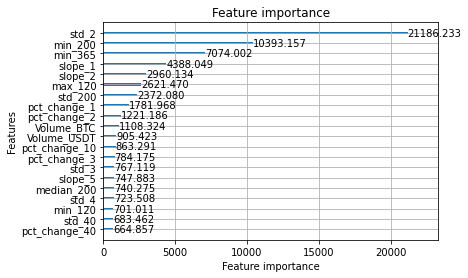

In [ ]:
lgb.plot_importance(learner, importance_type = 'gain', max_num_features  = 20 )
display()